In [1]:
from datetime import datetime
from IPython.display import Markdown, display

REPORT_TITLE = "Análisis Integral de Riesgo de Churn"
AUTHOR = "Jorge Gonzalez - Encargado del equipo de Ciencia de Datos"
REPORT_DATE = datetime.now().strftime("%Y-%m-%d")
EXEC_SUMMARY_POINTS = []
SUMMARY_STORE = {}

def render_portada(summary_points=None, title=REPORT_TITLE, author=AUTHOR, date=REPORT_DATE):
    """Renderiza la portada y el resumen ejecutivo."""
    points = summary_points if summary_points else [
        "Los indicadores clave se calcularán tras la ejecución completa del cuaderno.\n",
        "Las métricas de churn y segmentación se poblarán automáticamente más adelante.\n",
        "Revise la sección de Salud del dataset para comprender la calidad de los datos.\n",
        "La sección de Modelado documenta el desempeño de los clasificadores evaluados.\n",
        "Las recomendaciones accionables se sintetizan en la sección correspondiente al final.\n",
    ]
    bullets = "".join(f"- {p}" for p in points[:5])
    intro = f"""# {title}
**Fecha:** {date}  
**Autor:** {author}

---

## Resumen ejecutivo

**Objetivo:** Diagnosticar el riesgo de churn y ofrecer palancas accionables de retención.

**Datos utilizados:** Dataset principal (`DATA_PATH`) y diccionario de datos (`DICT_PATH`).

{bullets}

"""
    display(Markdown(intro))

render_portada()

# Análisis Integral de Riesgo de Churn
**Fecha:** 2025-09-26  
**Autor:** Jorge Gonzalez - Encargado del equipo de Ciencia de Datos

---

## Resumen ejecutivo

**Objetivo:** Diagnosticar el riesgo de churn y ofrecer palancas accionables de retención.

**Datos utilizados:** Dataset principal (`DATA_PATH`) y diccionario de datos (`DICT_PATH`).

- Los indicadores clave se calcularán tras la ejecución completa del cuaderno.
- Las métricas de churn y segmentación se poblarán automáticamente más adelante.
- Revise la sección de Salud del dataset para comprender la calidad de los datos.
- La sección de Modelado documenta el desempeño de los clasificadores evaluados.
- Las recomendaciones accionables se sintetizan en la sección correspondiente al final.




## Tabla de contenidos
- [1. Configuración y parámetros](#configuracion-y-parametros)
- [2. Carga de datos y diccionario](#carga-de-datos-y-diccionario)
- [3. Salud del dataset](#salud-del-dataset)
- [4. Análisis univariado](#analisis-univariado)
- [5. Análisis bivariado y multivariado](#analisis-bivariado-y-multivariado)
- [6. Preprocesado reproducible](#preprocesado-reproducible)
- [7. Modelos base y evaluación](#modelos-base-y-evaluacion)
- [8. Importancias y efecto de variables](#importancias-y-efecto-de-variables)
- [9. Interpretabilidad por cliente](#interpretabilidad-por-cliente)
- [10. Segmentación y patrones accionables](#segmentacion-y-patrones-accionables)
- [11. Umbral y decisiones de negocio](#umbral-y-decisiones-de-negocio)
- [12. Recomendaciones de retención](#recomendaciones-de-retencion)
- [13. Guardado y artefactos](#guardado-y-artefactos)
- [14. Siguientes pasos y anexos](#siguientes-pasos-y-anexos)

## 1. Configuración y parámetros
En este bloque definimos las rutas, semilla reproducible y parámetros clave que utilizará todo el notebook.

In [2]:
# Parametros centrales del analisis
from pathlib import Path

DATA_PATH = Path("data/dataset.csv")
DICT_PATH = Path("data/data_descriptions.csv")
SEPARATOR = ";"
DECIMAL = ","
TARGET = "churn"
ID_COL = "customer_id"
UNK_NUM_VARS = ["lor", "income", "numbcars", "adults"]
RANDOM_SEED = 753
TEST_SIZE = 0.2
CV_FOLDS = 5
MAX_CATEGORIES = 10
OHE_MIN_FREQUENCY = 0.005
NUMERIC_SCALER = "robust"
USE_WINSOR = True
WINSOR_LOWER_Q = 0.01
WINSOR_UPPER_Q = 0.99
CALIBRATION_METHOD = "isotonic"
COST_RETENTION = 25  # coste por intervencion
COST_CHURN = 200  # coste estimado de una baja
ARTIFACT_DIR = Path("artifacts")
ARTIFACT_DIR.mkdir(parents=True, exist_ok=True)

assert DATA_PATH.exists(), f"El archivo de datos no existe: {DATA_PATH}"
assert DICT_PATH.exists(), f"El diccionario de datos no existe: {DICT_PATH}"

print("Parametros configurados correctamente.")

Parametros configurados correctamente.


In [3]:
# librerias
import warnings
warnings.filterwarnings("ignore")

import json
import math
import re
import itertools
from collections import Counter
from datetime import date

import numpy as np
import pandas as pd
import polars as pl
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import plotly.express as px
import networkx as nx


from sklearn import metrics
from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder, LabelEncoder, RobustScaler, MinMaxScaler, FunctionTransformer
from category_encoders import TargetEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import SimpleImputer
from sklearn.impute import IterativeImputer
from sklearn.feature_selection import mutual_info_classif
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_validate
from sklearn.metrics import roc_auc_score, average_precision_score, log_loss, brier_score_loss, confusion_matrix
from sklearn.calibration import calibration_curve, CalibratedClassifierCV
from sklearn.inspection import permutation_importance, PartialDependenceDisplay
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.tree import DecisionTreeClassifier, export_text
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.utils.validation import check_is_fitted
from scipy import stats, sparse
from catboost import CatBoostClassifier

import statsmodels.api as sm

import lightgbm as lgb
import xgboost as xgb
import shap

sns.set_context("talk")
sns.set_palette("colorblind")
plt.rcParams.update({"figure.figsize": (10, 6), "axes.titlesize": 18, "axes.labelsize": 13})

print("Librerias cargadas")
pd.set_option('display.max_rows', None)

Librerias cargadas


In [38]:
# Funciones auxiliares
from typing import Iterable, List, Tuple, Dict, Optional


def standardize_column_name(name: str) -> str:
    """Convierte un nombre de columna a snake_case en minúsculas."""
    if name is None:
        raise ValueError("El nombre de columna no puede ser None")
    name = re.sub(r"[^0-9a-zA-Z]+", "_", str(name)).strip("_")
    name = re.sub(r"([a-z0-9])([A-Z])", r"_", name)
    return name.lower()


def resolve_columns(columns: Iterable[str], reference: Iterable[str]) -> Dict[str, str]:
    """Resuelve columnas buscando coincidencias insensibles a mayúsculas."""
    ref_map = {c.lower(): c for c in reference}
    resolved = {}
    for col in columns:
        key = col.lower()
        if key in ref_map:
            resolved[col] = ref_map[key]
        else:
            raise KeyError(f"No se encontró la columna '{col}' en el dataset")
    return resolved


def plot_missingness(df: pd.DataFrame, title: str = "Mapa de nulos") -> None:
    """Genera matriz y heatmap de valores faltantes."""
    if df.empty:
        raise ValueError("El dataframe está vacío")
    fig, ax = plt.subplots(figsize=(18, 6))
    
    missing_pct = df.isna().mean().to_frame(name="pct")
    order = missing_pct[missing_pct.pct > 0].sort_values("pct", ascending=False)
    sns.barplot(x=order.index, y=order.pct, ax=ax, color="#1f77b4")
    ax.set_title(f"{title} - Porcentaje de nulos")
    ax.set_ylabel("Proporción")
    ax.yaxis.set_major_formatter(mtick.PercentFormatter(1))
    ax.tick_params(axis='x', rotation=90)
    plt.tight_layout()
    plt.show()
    display(Markdown("_Conclusión: se visualiza la distribución de valores faltantes por registro y por columna._"))


def cramers_v(x: pd.Series, y: pd.Series) -> float:
    """Calcula Cramér's V entre dos variables categóricas."""
    contingency = pd.crosstab(x, y)
    chi2 = stats.chi2_contingency(contingency)[0]
    n = contingency.sum().sum()
    phi2 = chi2 / n
    r, k = contingency.shape
    phi2corr = max(0, phi2 - (k - 1)*(r - 1)/(n - 1))
    rcorr = r - (r - 1)**2 / (n - 1)
    kcorr = k - (k - 1)**2 / (n - 1)
    return math.sqrt(phi2corr / max((kcorr - 1)*(rcorr - 1), 1e-9))


def mutual_info_report(df: pd.DataFrame, target: str,  discrete_cols: List[str]) -> pd.DataFrame:
    """Calcula MI entre cada feature y el target con preprocesado"""
    if target not in df.columns:
        raise KeyError(f"Target '{target}' no encontrado en dataframe")

    # Separar X e y
    X = df.drop(columns=[target]).copy()
    y = df[target].copy()

    # Encode de categóricas a códigos enteros, con -1 para NaN o desconocidos
    for c in discrete_cols:
        X[c] = X[c].astype("category")
        X[c] = X[c].cat.codes.astype("int64")  # .cat.codes devuelve -1 para NaN

    continuous_cols = [c for c in X.columns if c not in discrete_cols]
    if continuous_cols:
        X[continuous_cols] = X[continuous_cols].fillna(0.0)
        
    discrete_mask = [c in set(discrete_cols) for c in X.columns]
    mi = mutual_info_classif(X.values, y.values, discrete_features=discrete_mask, random_state=RANDOM_SEED)

    res = (pd.DataFrame({"feature": X.columns, "mutual_info": mi}).sort_values("mutual_info", ascending=False, kind="mergesort").reset_index(drop=True))
    return res


def vif_report(df: pd.DataFrame) -> pd.DataFrame:
    """Calcula VIF (Variance Inflation Factor) para cada columna numérica de un DataFrame."""
    X = sm.add_constant(df)  # añade constante para intercepto
    vif_data = []

    for i, col in enumerate(X.columns):
        if col == "const":
            continue
        vif = variance_inflation_factor(X.values, i)
        vif_data.append({"feature": col, "vif": vif})

    return pd.DataFrame(vif_data).sort_values("vif", ascending=False)


def plot_calibration(y_true, y_prob, title: str = "Curva de calibración"):
    """Genera curva de calibración y histograma de probabilidades."""
    fig, ax = plt.subplots(figsize=(8,6))
    prob_true, prob_pred = calibration_curve(y_true, y_prob, n_bins=10)
    ax.plot(prob_pred, prob_true, marker='o', label='Modelo')
    ax.plot([0,1],[0,1], linestyle='--', color='grey', label='Perfecto')
    ax.set_title(title)
    ax.set_xlabel('Probabilidad estimada')
    ax.set_ylabel('Probabilidad observada')
    ax.legend()
    plt.show()
    display(Markdown("_Conclusión: la curva indica el grado de calibración del modelo._"))


def profit_curve(y_true, y_prob, cost_retain=COST_RETENTION, cost_churn=COST_CHURN):
    """Calcula la curva de beneficios y retorna dataframe con ganancias por umbral."""
    thresholds = np.linspace(0, 1, 101)
    records = []
    for thr in thresholds:
        y_pred = (y_prob >= thr).astype(int)
        tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
        benefit = tp * (cost_churn - cost_retain) - fp * cost_retain - fn * cost_churn
        records.append({"threshold": thr, "profit": benefit, "tp": tp, "fp": fp, "fn": fn, "tn": tn})
    df_profit = pd.DataFrame(records)
    best = df_profit.loc[df_profit.profit.idxmax()]

    fig, ax = plt.subplots(figsize=(8,6))
    ax.plot(df_profit.threshold, df_profit.profit, color="#2ca02c")
    ax.axvline(best.threshold, color='red', linestyle='--', label=f"Óptimo: {best.threshold:.2f}")
    ax.set_title("Curva de beneficio vs. umbral")
    ax.set_xlabel("Umbral de decisión")
    ax.set_ylabel("Beneficio esperado")
    ax.legend()
    plt.show()
    display(Markdown("_Conclusión: la curva permite seleccionar el umbral que maximiza el beneficio esperado._"))
    return df_profit


def shap_summary_and_waterfall(model, X_sample, X_bg, feature_names, target_name="churn"):
    """Calcula y grafica SHAP summary y waterfall para una fila representativa."""
    
    predict_proba_pos = lambda X: champion_model.named_steps['clf'].predict_proba(X)[:, 1]
    explainer = shap.Explainer(predict_proba_pos, X_bg, feature_names=feature_names )
    shap_values = explainer(X_bg)

    proba = model.predict_proba(X_sample)[:, 1]
    expected_value = shap_values.base_values.mean()
    mean_abs_shap = np.abs(shap_values.values).mean(axis=0)
    global_importance = (pd.DataFrame({"feature": feature_names, "mean_abs_shap": mean_abs_shap}).sort_values("mean_abs_shap", ascending=False).reset_index(drop=True))
    topk = 10

    display(Markdown(f"**Base rate estimada por SHAP**, {expected_value:.3f}"))
    display(Markdown("**Top variables por impacto medio absoluto en la probabilidad**"))
    display(global_importance.head(topk).style.format({"mean_abs_shap": "{:.6f}"}))
    
    plt.figure(figsize=(9, 6))
    shap.summary_plot( shap_values,  features=X_sample, feature_names=feature_names, plot_type="bar",  max_display=topk, show=False)
    plt.title(f"Ranking global, media de |SHAP|, top {topk}")
    plt.tight_layout()
    plt.show()
    
    return global_importance


def pdp_ice_plot(model, X, feature, feature_names):
    """Genera gráficos PDP e ICE para una variable específica."""
    fig, ax = plt.subplots(figsize=(8,6))
    PartialDependenceDisplay.from_estimator(model, X, [feature], ax=ax, kind='both')
    ax.set_title(f"PDP/ICE para {feature_names[feature] if isinstance(feature, int) else feature}")
    plt.tight_layout()
    plt.show()
    display(Markdown("_Conclusión: el PDP/ICE muestra el efecto marginal de la característica sobre la probabilidad de churn._"))


def segment_describer(df_segments: pd.DataFrame, cluster_col: str, target_col: str) -> pd.DataFrame:
    """Describe clusters con tasa de churn y rasgos dominantes."""
    summary = df_segments.groupby(cluster_col).agg(
        count=('cluster', 'size'),
        churn_rate=(target_col, 'mean')
    ).reset_index()
    summary['churn_rate'] = summary['churn_rate'].round(4)
    return summary


def rule_extractor(X, y, feature_names, max_depth=3, min_samples_leaf=50):
    """Extrae reglas interpretables mediante un árbol pequeño."""
    clf = DecisionTreeClassifier(max_depth=max_depth, min_samples_leaf=min_samples_leaf, random_state=RANDOM_SEED)
    clf.fit(X, y)
    rules = export_text(clf, feature_names=list(feature_names))
    return clf, rules

def register_engineered_features(raw_df: pd.DataFrame, meta_df: pd.DataFrame, raw_dict: pd.DataFrame, features_info: dict):
    """Añade variables ingenierizadas a raw_df, meta_df y raw_dict"""
    for col, info in features_info.items():
        col_std = standardize_column_name(col)
        
        if col_std not in raw_df.columns:
            raw_df[col_std] = features_info[col]["serie"].reindex(raw_df.index)

        desc = features_info[col_std].get("descripcion", "Ingeniería de atributos")
        tipo = features_info[col_std].get("tipo", str(raw_df[col_std].dtype))
        
        if col_std not in raw_dict["variable"]:
            raw_dict = pd.concat([raw_dict, pd.DataFrame([{"variable": col_std, "descripcion": desc}])], ignore_index=True)

        # añadir a meta_df si no existe
        if col_std not in meta_df["columna"]:
            meta_df = pd.concat([ meta_df, pd.DataFrame([{"columna": col_std, "tipo": tipo, 
                                                            "nulos_%": float(raw_df[col_std].isna().mean()),
                                                            "descripcion": desc,
                                                            "candidata": 1,
                                                            "motivo": "Feature engineering",
                                                             "feature": col_std}])], ignore_index=True)

    # redondeo y orden opcional, igual que en tu código
    meta_df["nulos_%"] = meta_df["nulos_%"].round(4)
    return raw_df, meta_df, raw_dict

def classify_encoding(X, cat_features, low_cardinality_threshold=10, rare_threshold=0.01, detect_ordinal_like=True):
    """Clasifica variables categóricas en One-Hot Encoding (OHE), Target Encoding (TE) y Ordinal Encoding (ORD) según cardinalidad y rareza de categorías."""
    one_hot_features = []
    target_enc_features = []
    ordinal_features = []
    n_rows = len(X)

    for c in cat_features:
        freqs = X[c].value_counts(dropna=True)
        n_cat = freqs.shape[0]
        
        if detect_ordinal_like:
            vals = freqs.index.astype(str)
            if all(v.replace("-", "").replace(".", "").isdigit() for v in vals):
                ordinal_features.append(c)
                continue

        props = freqs / n_rows
        has_rare = (props < rare_threshold).any()

        if n_cat <= low_cardinality_threshold and not has_rare:
            one_hot_features.append(c)
        else:
            target_enc_features.append(c)

    return one_hot_features, target_enc_features, ordinal_features

## 2. Carga de datos y diccionario
En esta sección leemos la fuente principal de datos y el diccionario, homogenizamos los nombres de variables, inspeccionamos las primeras filas y aseguramos que la variable objetivo quede codificada en formato binario (0: no churn, 1: churn). También validamos duplicados sobre las columnas identificadoras suministradas.

In [5]:
# Lectura de datos
raw_df = pd.read_csv(DATA_PATH, sep=SEPARATOR, decimal=DECIMAL)
raw_dict = pd.read_csv(DICT_PATH, sep=SEPARATOR)
print(f"Dataset cargado: {raw_df.shape[0]:,} filas y {raw_df.shape[1]:,} columnas")

# Normalización de nombres
original_columns = raw_df.columns.tolist()
normalized_map = {col: standardize_column_name(col) for col in original_columns}
raw_df.rename(columns=normalized_map, inplace=True)
raw_dict.columns = [standardize_column_name(c) for c in raw_dict.columns]
raw_dict['variable'] = raw_dict['variable'].apply(standardize_column_name)
raw_dict.rename(columns={'significado': 'descripcion'}, inplace=True)

raw_df[ID_COL] = raw_df[ID_COL].astype(str)

# Resolución de ID columns
resolved_ids = {}
for col in [ID_COL]:
    try:
        resolved = resolve_columns([col], raw_df.columns)
        resolved_ids[col] = resolved[col]
    except KeyError:
        print(f"Advertencia: la columna identificadora '{col}' no se encontró. Se omitirá en chequeos de duplicados.")

# Visualización rápida
display(raw_df.head(3))

# Estadísticas iniciales
dtypes_summary = raw_df.dtypes.value_counts()
print("Tipos de dato principales:\n\n", dtypes_summary)

# Diccionario combinado
meta = []
for col in raw_df.columns:
    desc = raw_dict.loc[raw_dict['variable'] == col, 'descripcion']
    meta.append({
        'columna': col,
        'tipo': str(raw_df[col].dtype),
        'nulos_%': raw_df[col].isna().mean(),
        'descripcion': desc.iloc[0] if not desc.empty else "NA",
        'candidata': 1,
        'motivo': ''
    })
meta_df = pd.DataFrame(meta)

# Manejo de target
assert TARGET in raw_df.columns, f"El target '{TARGET}' no existe en el dataset"
unique_target = raw_df[TARGET].dropna().unique()
print("Valores únicos de la etiqueta antes de la normalización:", unique_target)

label_encoder = LabelEncoder()
if raw_df[TARGET].dtype == 'O':
    temp = raw_df[TARGET].astype(str).str.strip().str.lower()
    temp = temp.replace({
        'yes': '1', 'si': '1', 'true': '1', 'y': '1',
        'no': '0', 'false': '0', 'n': '0'
    })
    raw_df[TARGET] = temp

if raw_df[TARGET].dtype == 'O':
    raw_df[TARGET] = label_encoder.fit_transform(raw_df[TARGET])
else:
    raw_df[TARGET] = raw_df[TARGET].astype(int)
    label_encoder.classes_ = np.array(sorted(np.unique(raw_df[TARGET])))

assert set(raw_df[TARGET].unique()) <= {0, 1}, "El target debe estar en {0,1} tras normalización"

if resolved_ids:
    duplicates = raw_df.duplicated(subset=list(resolved_ids.values()))
    dup_count = duplicates.sum()
    print(f"Duplicados detectados por IDs {list(resolved_ids.values())}: {dup_count}")
    if dup_count > 0:
        SUMMARY_STORE['duplicados'] = int(dup_count)
        display(raw_df.loc[duplicates, list(resolved_ids.values()) + [TARGET]].head())
        print("Se recomienda revisar estos registros.")
    else:
        print("No se detectaron clientes duplicados.")

SUMMARY_STORE['n_rows'] = int(raw_df.shape[0])
SUMMARY_STORE['n_cols'] = int(raw_df.shape[1])
SUMMARY_STORE['target_rate'] = float(raw_df[TARGET].mean())
SUMMARY_STORE['target_values'] = raw_df[TARGET].value_counts(normalize=True).to_dict()

meta_df['nulos_%'] = meta_df['nulos_%'].round(5)
#display("SUMMARY_STORE: ", SUMMARY_STORE)
display(meta_df.head(10))

Dataset cargado: 100,000 filas y 100 columnas


,rev_mean,mou_mean,totmrc_mean,da_mean,ovrmou_mean,ovrrev_mean,vceovr_mean,datovr_mean,roam_mean,change_mou,...,forgntvl,ethnic,kid0_2,kid3_5,kid6_10,kid11_15,kid16_17,creditcd,eqpdays,customer_id
0,23.9975,219.25,22.500,0.2475,0.00,0.0,0.0,0.0,0.0,-157.25,...,0.0,N,U,U,U,U,U,Y,361.0,1000001
1,57.4925,482.75,37.425,0.2475,22.75,9.1,9.1,0.0,0.0,532.25,...,0.0,Z,U,U,U,U,U,Y,240.0,1000002
2,16.9900,10.25,16.990,0.0000,0.00,0.0,0.0,0.0,0.0,-4.25,...,0.0,N,U,Y,U,U,U,Y,1504.0,1000003


Tipos de dato principales:

 float64    69
object     22
int64       9
dtype: int64
Valores únicos de la etiqueta antes de la normalización: [1 0]
Duplicados detectados por IDs ['customer_id']: 0
No se detectaron clientes duplicados.


,columna,tipo,nulos_%,descripcion,candidata,motivo
0,rev_mean,float64,0.00357,Mean monthly revenue (charge amount),1,
1,mou_mean,float64,0.00357,Mean number of monthly minutes of use,1,
2,totmrc_mean,float64,0.00357,Mean total monthly recurring charge,1,
3,da_mean,float64,0.00357,Mean number of directory assisted calls,1,
4,ovrmou_mean,float64,0.00357,Mean overage minutes of use,1,
5,ovrrev_mean,float64,0.00357,Mean overage revenue,1,
6,vceovr_mean,float64,0.00357,Mean revenue of voice overage,1,
7,datovr_mean,float64,0.00357,Mean revenue of data overage,1,
8,roam_mean,float64,0.00357,Mean number of roaming calls,1,
9,change_mou,float64,0.00891,Percentage change in monthly minutes of use vs...,1,


In [6]:
# Tabla de diccionario
numerical_cols = [c for c in raw_df.select_dtypes(include=[np.number]).columns.tolist()  if c != TARGET and c not in UNK_NUM_VARS]
categorical_cols = [c for c in raw_df.columns if (c not in numerical_cols) and c != TARGET and c != ID_COL]

## 3. Salud del dataset
Evaluamos la completitud, consistencia y posibles riesgos de fuga del target. Se revisan nulos, cardinalidad, columnas constantes y correlaciones extremas.

In [7]:
## Analizar lineas poco utiles por falta de datos

# Crear máscaras booleanas
is_missing = raw_df.isna()
is_zero = raw_df[numerical_cols].apply(lambda col: pd.to_numeric(col, errors="coerce")).eq(0)

# Calcular porcentaje de nulos o ceros por fila
pct_nulls =  is_missing.sum(axis=1) / raw_df.shape[1]
pct_zero = is_zero.sum(axis=1) / raw_df.shape[1]

mask_problematic = (is_missing | is_zero)
pct_comb = mask_problematic.sum(axis=1) / raw_df.shape[1]

# Un cliente con > 60 % de vacíos no siempre es basura, puede representar clientes de bajo uso, 
# nuevos contratos con poco histórico o clientes de segmentos específicos que sí son relevantes para explicar el churn.

#print(pct_comb[ pct_comb > 0.6])
display(raw_df.loc[pct_comb > 0.6, :])

# Nuevas variables: flag binario para regresiones y pct continuo para arboles
# Solo hay un cliente que lo cumple, decidimos elimnar cliente. Aporta nulos a variables que si no, no lo serian.

# raw_df, meta_df, raw_dict = register_engineered_features(raw_df, meta_df, raw_dict,
#     features_info={
#         "pct_missing": {
#             "serie": pd.Series(pct_comb),  # None si ya existe
#             "descripcion": "Porcentaje de variables vacías o nulas sobre el total por cliente.",
#             "tipo": "float64"
#         },
#         "flag_high_missing": {
#             "serie": pd.Series(pct_comb > 0.6).astype(int),  # None si ya existe
#             "descripcion": "Flag binario de cliente muy incompleto (Umbral 60%) ",
#             "tipo": "int64"
#         }
#     }
# )

unaltered_df = raw_df.copy()
# Filtramos un cliente dado que es el mas incompleto e incluye el unico valor vacio en ciertas variables como 
# eqpdays, phones, models
# Filtramos directamente el Customer_ID que no nos interesa ni para analizarlo 
raw_df = raw_df[raw_df[ID_COL] != '1077200']
raw_df = raw_df[[c for c in raw_df.columns if c != ID_COL]]


,rev_mean,mou_mean,totmrc_mean,da_mean,ovrmou_mean,ovrrev_mean,vceovr_mean,datovr_mean,roam_mean,change_mou,...,forgntvl,ethnic,kid0_2,kid3_5,kid6_10,kid11_15,kid16_17,creditcd,eqpdays,customer_id
77199,76.98,0.0,86.98,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,Z,U,U,U,U,U,N,NaN,1077200


Top columnas con nulos:


,columna,tipo,nulos_%,descripcion
87,numbcars,float64,0.49366,Known number of vehicles
89,dwllsize,object,0.38308,Dwelling size
88,hhstatin,object,0.37923,Premier household status indicator
80,ownrent,object,0.33706,Home owner/renter status
82,dwlltype,object,0.31909,Dwelling Unit type
81,lor,float64,0.30190,Length of residence
86,income,float64,0.25436,Estimated income
84,adults,float64,0.23019,Number of adults in household
85,infobase,object,0.22079,InfoBase match
77,hnd_webcap,object,0.10189,Handset web capability


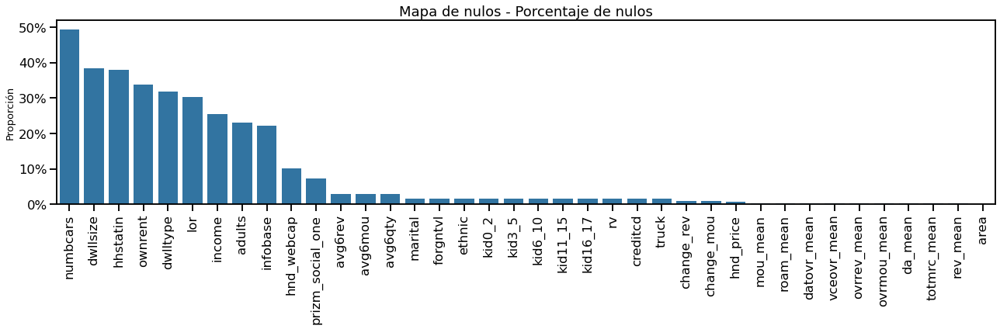

_Conclusión: se visualiza la distribución de valores faltantes por registro y por columna._

Columnas constantes: []
Columnas cuasi-constantes: ['drop_dat_mean', 'blck_dat_mean', 'unan_dat_mean', 'recv_sms_mean', 'callfwdv_mean']


crclscod            54
area                20
ethnic              18
lor                 17
dwllsize            16
income              10
hhstatin             7
adults               7
prizm_social_one     6
marital              6
dtype: int64

Distribución del target:
0    0.504375
1    0.495625
Name: churn, dtype: float64


In [8]:
missing_pct = meta_df[['columna', 'tipo', 'nulos_%', 'descripcion']].sort_values('nulos_%', ascending=False)
print("Top columnas con nulos:")
display(missing_pct.head(10))

plot_missingness(raw_df)

#Registro de variables problematicas y poco representativas.
meta_df.loc[meta_df['columna'].isin(["dwllsize", "hhstatin", "ownrent", "dwlltype", "infobase"]),'candidata'] = 0
meta_df.loc[meta_df['columna'].isin(["dwllsize", "hhstatin", "ownrent", "dwlltype", "infobase"]),'motivo'] = "Gran cantidad de nulos y baja información mutua"

meta_df.loc[meta_df['columna'].isin([ID_COL, TARGET]),'candidata'] = 0
meta_df.loc[meta_df['columna']==ID_COL,'motivo'] = "Identificador único de cliente"
meta_df.loc[meta_df['columna']==TARGET,'motivo'] = "Variable objetivo"

# Variables categoricas ordinales: 
# lor, income -> codificadas de forma ordinal en categorias. Muchos nulos >~25k. Aporta mas la relazion valor desconocido con el churn
# numbcars, adults -> rango de valores entre 1 y n. Muchos nulos >~20k. Categoria desconocida, -1
# otras variables binarias con pocos nulos, se mantiene el rellenado con 0.

num_to_unknown = sorted(UNK_NUM_VARS)
num_to_zero = sorted([c for c in numerical_cols if c != TARGET])

# categóricas a categoría explícita Unknown
cat_to_unknown = sorted([c for c in categorical_cols if c != TARGET and c not in UNK_NUM_VARS])

# numéricas a cero
raw_df[num_to_zero] = raw_df[num_to_zero].fillna(0)

# numéricas a desconocido
raw_df[num_to_unknown] = raw_df[num_to_unknown].fillna(-1)

# numéricas a mediana
# medians = raw_df[num_to_median].median(numeric_only=True)
# raw_df[num_to_median] = raw_df[num_to_median].fillna(medians)

# categóricas a Unknown
raw_df[cat_to_unknown] = raw_df[cat_to_unknown].fillna("Unknown").astype(str)

# consolidar columnas de hijos en una única varaible binaria
kid_cols = ["kid0_2","kid3_5","kid6_10","kid11_15","kid16_17"]

#Registro de variables problematicas y poco representativas.
meta_df.loc[meta_df['columna'].isin(kid_cols),'candidata'] = 0
meta_df.loc[meta_df['columna'].isin(kid_cols),'motivo'] = "Consolidazión de columnas de hijos con baja MI en un único indicador binario para reducción de dimensionalidad."

if kid_cols:
    temp = pd.DataFrame(index=raw_df.index)
    for c in kid_cols:
        if c in categorical_cols:
            temp[c] = raw_df[c].astype(str).str.lower().isin(["Y","y"]).astype(int)
        else:
            temp[c] = pd.to_numeric(raw_df[c], errors="coerce").fillna(0).clip(lower=0).astype(int)
    raw_df["has_kids"] = (temp.sum(axis=1) > 0).astype(int)

numerical_cols.append("has_kids")

raw_df, meta_df, raw_dict = register_engineered_features(raw_df, meta_df, raw_dict,
    features_info={
        "has_kids": {
            "serie": None,  # None si ya existe
            "descripcion": "Indicador de presencia de hijos en el hogar derivado de kid0_2, kid3_5, kid6_10, kid11_15 y kid16_17",
            "tipo": "int64"
        }
    }
)


constant_cols = [c for c in raw_df.columns if raw_df[c].nunique() <= 1]
quasi_constant_cols = [c for c in raw_df.columns if raw_df[c].value_counts(normalize=True).iloc[0] > 0.95]
print("Columnas constantes:", constant_cols)
print("Columnas cuasi-constantes:", quasi_constant_cols)

#Registro de variables problematicas y poco representativas.
meta_df.loc[meta_df['columna'].isin(constant_cols),'candidata'] = 0
meta_df.loc[meta_df['columna'].isin(constant_cols),'motivo'] = "Variable constante. No aporta nada al modelo."

meta_df.loc[meta_df['columna'].isin(quasi_constant_cols),'candidata'] = 0
meta_df.loc[meta_df['columna'].isin(quasi_constant_cols),'motivo'] = "Variable casi constante. Umbral de máximo 95% la categoría más frecuente"

# Cardinalidad de categóricas. Exceptuando customer_id como identificador único, el resto de variables se mantienen al no tener cardinalidad excesiva.
cat_card = raw_df[categorical_cols].nunique(dropna=False).sort_values(ascending=False)
display(cat_card.head(10))

# Proporción del target
value_counts = raw_df[TARGET].value_counts(normalize=True)
print("Distribución del target:")
print(value_counts)

# Heurística de fuga de objetivo (correlación > 0.95)
high_corr = {}
for col in numerical_cols:
    if col == TARGET:
        continue
    corr = raw_df[[col, TARGET]].dropna().corr().iloc[0,1]
    if abs(corr) > 0.95:
        high_corr[col] = corr

if high_corr:
    print("Posibles fugas por correlación extrema:\n", high_corr)
    meta_df.loc[meta_df['columna'].isin(high_corr.keys()),'candidata'] = 0
    meta_df.loc[meta_df['columna'].isin(high_corr.keys()),'motivo'] = "Posibles fugas por correlación extrema (Umbral 0.95)"

SUMMARY_STORE['constant_cols'] = constant_cols
SUMMARY_STORE['quasi_constant_cols'] = quasi_constant_cols
SUMMARY_STORE['high_corr_cols'] = high_corr
SUMMARY_STORE['missing_top'] = missing_pct.head(5).to_dict()
SUMMARY_STORE['target_rate_pct'] = float(value_counts.get(1, 0))

In [9]:
# MI preliminar
mi_report = mutual_info_report(raw_df.fillna(0), TARGET, categorical_cols)
meta_df = meta_df.merge(mi_report, left_on='columna', right_on='feature', how='left')
meta_df['mutual_info'] = meta_df['mutual_info'].fillna(0)
meta_df['relevancia_preliminar'] = pd.qcut(meta_df['mutual_info'].rank(method='first'), 4, labels=["Baja", "Media", "Alta", "Crítica"])
meta_df_sorted = meta_df[['columna', 'tipo', 'nulos_%', 'descripcion', 'mutual_info', 'relevancia_preliminar']].sort_values('mutual_info', ascending=False)
display(meta_df_sorted)

display(Markdown("_Conclusión: Las variables con mayor mutual information son candidatas a explicar el churn._"))

,columna,tipo,nulos_%,descripcion,mutual_info,relevancia_preliminar
98,eqpdays,float64,0.0000,Number of days (age) of current mobile phone,0.017761,Crítica
49,months,int64,0.0000,Total number of months in service,0.017389,Crítica
2,totmrc_mean,float64,0.0036,Mean total monthly recurring charge,0.010459,Crítica
74,hnd_price,float64,0.0085,Current handset price,0.007872,Crítica
9,change_mou,float64,0.0089,Percentage change in monthly minutes of use vs...,0.007628,Crítica
1,mou_mean,float64,0.0036,Mean number of monthly minutes of use,0.007318,Crítica
50,uniqsubs,int64,0.0000,Number of unique subscribers in the household,0.007062,Crítica
51,actvsubs,int64,0.0000,Number of active subscribers in household,0.006822,Crítica
24,ccrndmou_mean,float64,0.0000,Mean rounded minutes of use of customer care c...,0.005039,Crítica
64,avg3mou,int64,0.0000,Average monthly minutes of use over the previo...,0.004967,Crítica


_Conclusión: Las variables con mayor mutual information son candidatas a explicar el churn._

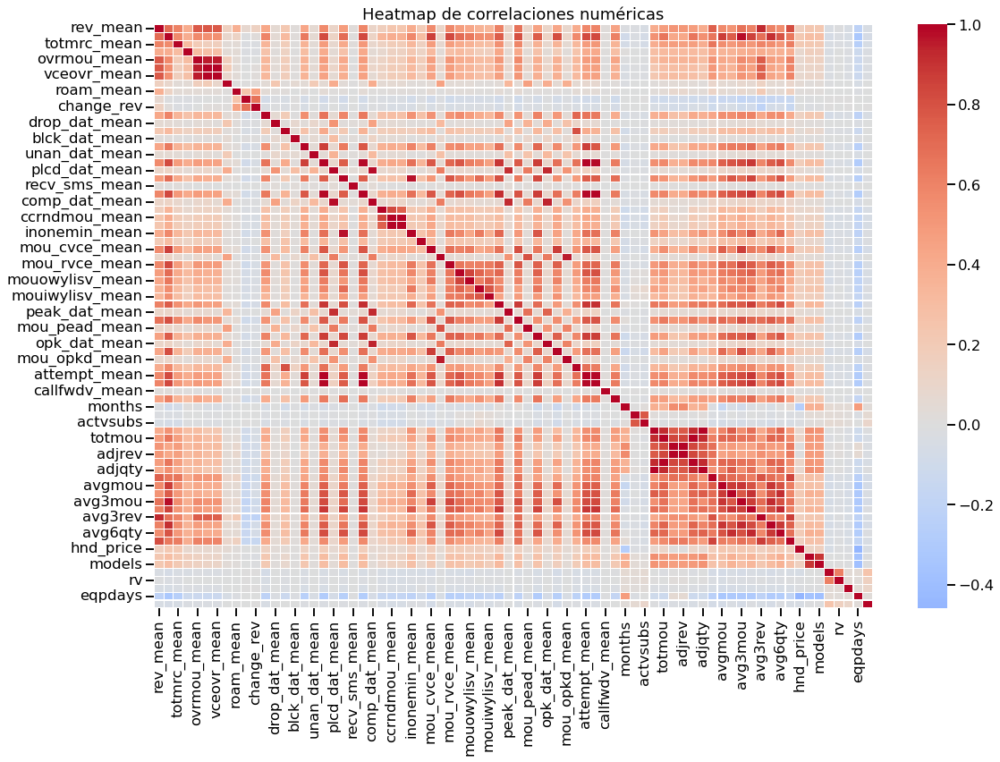

_Conclusión: Identifica pares de variables altamente correlacionadas para evitar redundancias._

In [10]:
# Heatmap de correlaciones numéricas
if len(numerical_cols) > 1:
    numeric_df = raw_df[numerical_cols].copy()
    correlation_matrix = numeric_df.corr()
    plt.figure(figsize=(18, 12))
    sns.heatmap(correlation_matrix, cmap='coolwarm', center=0, linewidths=0.1)
    plt.title("Heatmap de correlaciones numéricas")
    plt.show()
    display(Markdown("_Conclusión: Identifica pares de variables altamente correlacionadas para evitar redundancias._"))
else:
    print("No hay suficientes variables numéricas para calcular correlaciones.")

In [11]:
# Variables con correlación >= 0.85, aportan prácticamente la misma información. Esto genera colinealidad. 
# los modelos lineales se vuelven inestables, y los modelos de árbol pueden repartir importancia entre ambas y dar una señal confusa

corr_pairs = correlation_matrix.unstack()
corr_pairs = corr_pairs.drop_duplicates().dropna()
high_corr = corr_pairs[(abs(corr_pairs) < 1)]
high_corr_pairs = high_corr.sort_values(ascending=False)

THRESH = 0.85  # umbral de correlación absoluta

mi = meta_df.set_index("columna")["mutual_info"].dropna()
common = mi.index.intersection(correlation_matrix.index)
corr = correlation_matrix.loc[common, common]
mi = mi.loc[common].sort_values(ascending=False)

# Greedy por MI de mayor a menor
chosen = []
excluded = set()
kicked_by = {}

for var in mi.index:
    
    if var in excluded:
        continue
    
    chosen.append(var)
    neigh = corr.index[(corr[var].abs() >= THRESH) & (corr[var].abs() < 1.0)]
    losers = [v for v in neigh]
    kicked_by[var] = losers
    excluded.update(losers)
    
    #Registro de variables problematicas y poco representativas.
    meta_df.loc[meta_df['columna'].isin(losers),'candidata'] = 0
    meta_df.loc[meta_df['columna'].isin(losers),'motivo'] = f"Variable alttamente correlacionada ({THRESH}) con la variable {var} que tiene mayor MI"


print("\nTop 10 variables mas correlacionadas:\n", high_corr_pairs[:10])
print(f"\nVariables excluidas por colinealidad:\n {excluded}")



Top 10 variables mas correlacionadas:
 totcalls       adjqty           0.999798
totmou         adjmou           0.999747
totrev         adjrev           0.998492
plcd_vce_mean  attempt_mean     0.998398
comp_vce_mean  complete_mean    0.997706
ovrrev_mean    vceovr_mean      0.994756
ccrndmou_mean  cc_mou_mean      0.988852
attempt_mean   complete_mean    0.985504
plcd_vce_mean  comp_vce_mean    0.985459
comp_vce_mean  attempt_mean     0.983922
dtype: float64

Variables excluidas por colinealidad:
 {'recv_vce_mean', 'peak_vce_mean', 'cc_mou_mean', 'avg6qty', 'attempt_mean', 'comp_vce_mean', 'avgmou', 'vceovr_mean', 'totcalls', 'mou_cdat_mean', 'avg3qty', 'peak_dat_mean', 'adjrev', 'avg3rev', 'totmou', 'adjmou', 'avg3mou', 'mou_cvce_mean', 'complete_mean', 'phones', 'plcd_vce_mean', 'avg6mou', 'comp_dat_mean', 'ovrrev_mean', 'opk_dat_mean'}


## 4. Análisis univariado
Exploramos cada variable individualmente para identificar distribuciones, outliers y patrones iniciales relacionados con la tasa de churn.

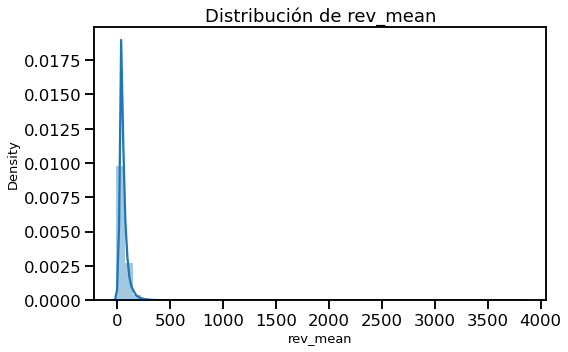

_Conclusión: La distribución de **rev_mean** muestra la concentración de valores que podrían incidir en churn._

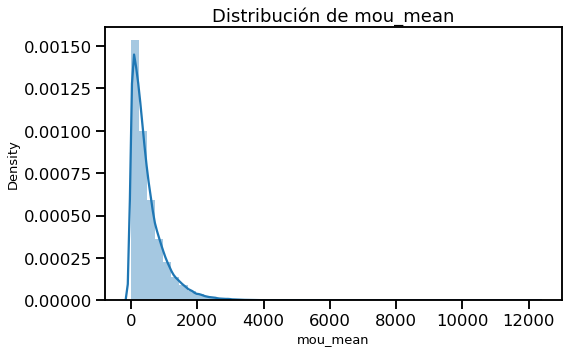

_Conclusión: La distribución de **mou_mean** muestra la concentración de valores que podrían incidir en churn._

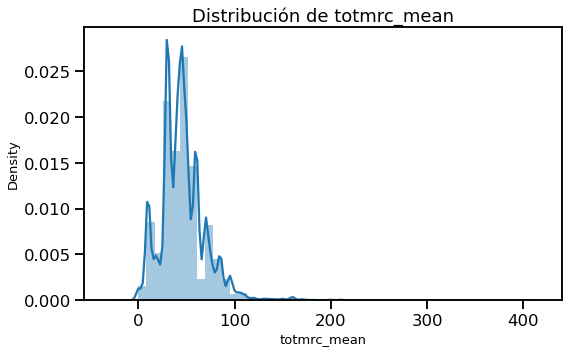

_Conclusión: La distribución de **totmrc_mean** muestra la concentración de valores que podrían incidir en churn._

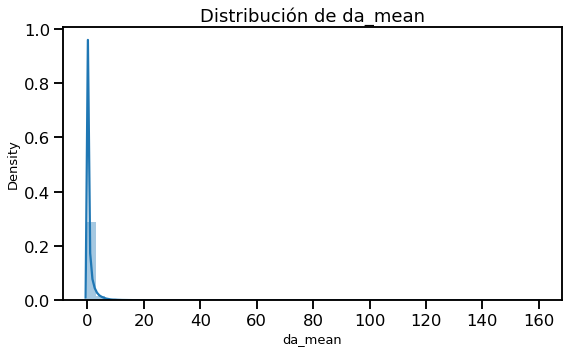

_Conclusión: La distribución de **da_mean** muestra la concentración de valores que podrían incidir en churn._

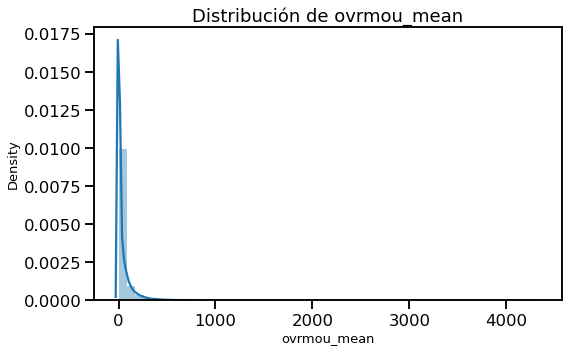

_Conclusión: La distribución de **ovrmou_mean** muestra la concentración de valores que podrían incidir en churn._

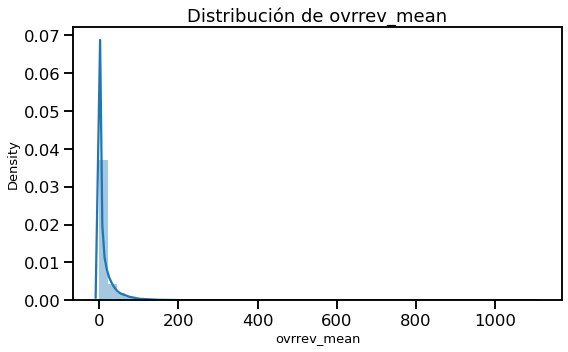

_Conclusión: La distribución de **ovrrev_mean** muestra la concentración de valores que podrían incidir en churn._

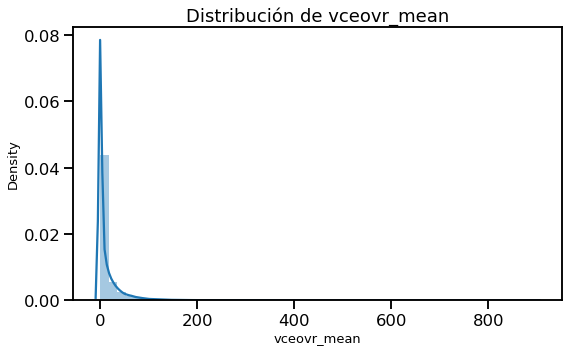

_Conclusión: La distribución de **vceovr_mean** muestra la concentración de valores que podrían incidir en churn._

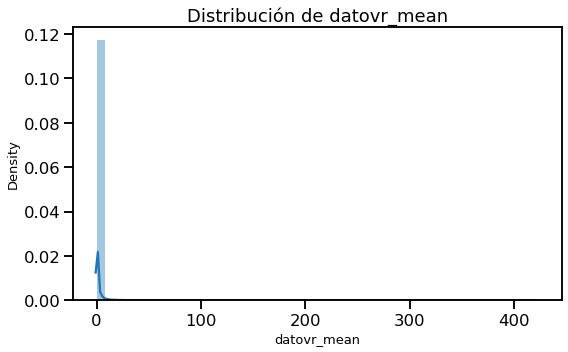

_Conclusión: La distribución de **datovr_mean** muestra la concentración de valores que podrían incidir en churn._

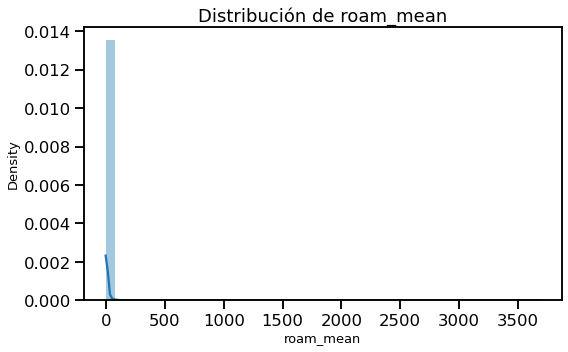

_Conclusión: La distribución de **roam_mean** muestra la concentración de valores que podrían incidir en churn._

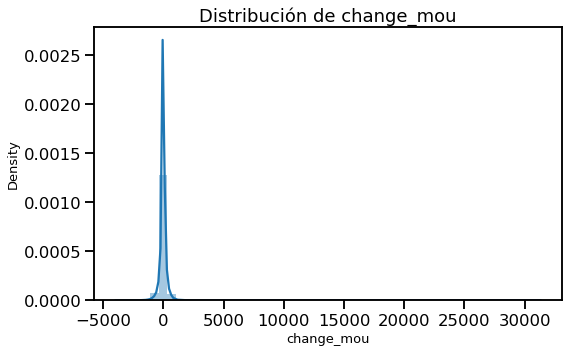

_Conclusión: La distribución de **change_mou** muestra la concentración de valores que podrían incidir en churn._

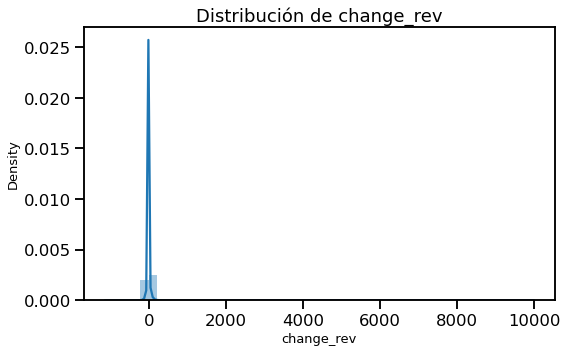

_Conclusión: La distribución de **change_rev** muestra la concentración de valores que podrían incidir en churn._

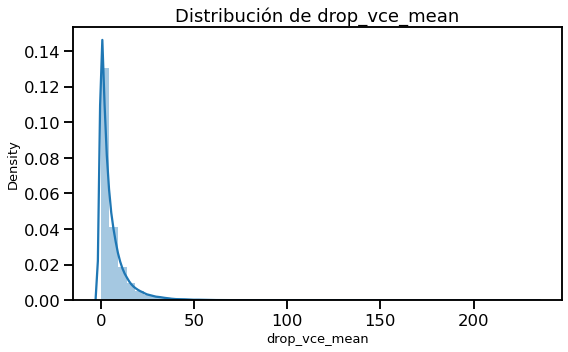

_Conclusión: La distribución de **drop_vce_mean** muestra la concentración de valores que podrían incidir en churn._

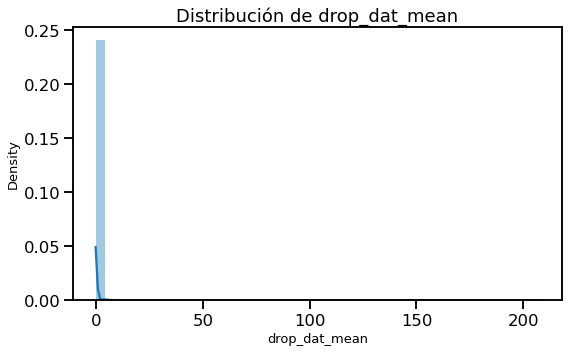

_Conclusión: La distribución de **drop_dat_mean** muestra la concentración de valores que podrían incidir en churn._

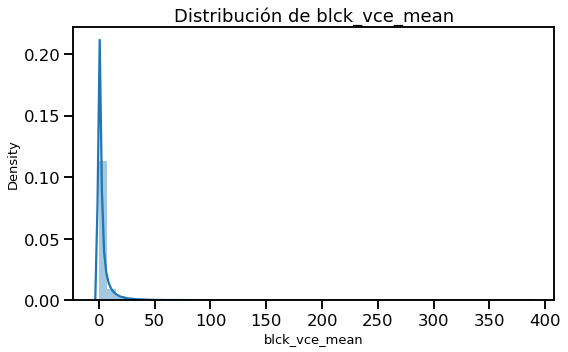

_Conclusión: La distribución de **blck_vce_mean** muestra la concentración de valores que podrían incidir en churn._

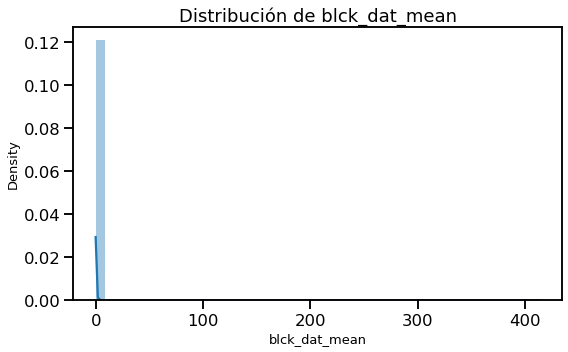

_Conclusión: La distribución de **blck_dat_mean** muestra la concentración de valores que podrían incidir en churn._

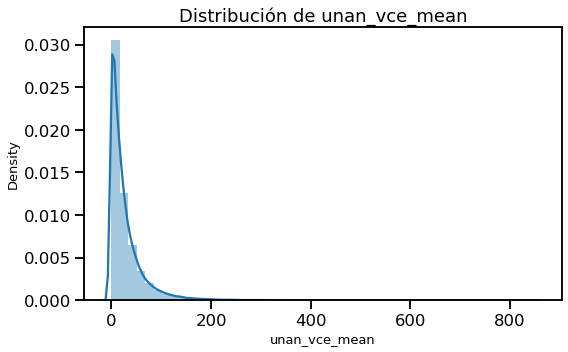

_Conclusión: La distribución de **unan_vce_mean** muestra la concentración de valores que podrían incidir en churn._

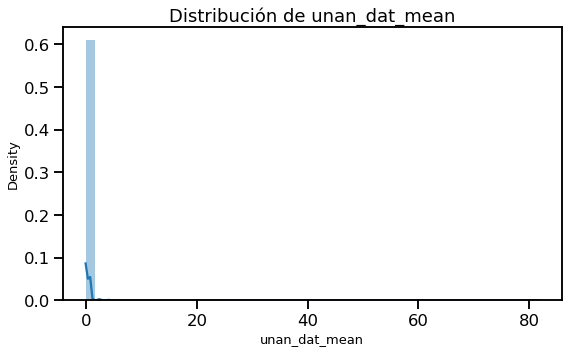

_Conclusión: La distribución de **unan_dat_mean** muestra la concentración de valores que podrían incidir en churn._

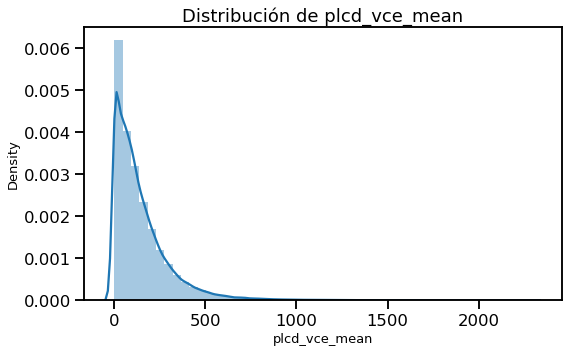

_Conclusión: La distribución de **plcd_vce_mean** muestra la concentración de valores que podrían incidir en churn._

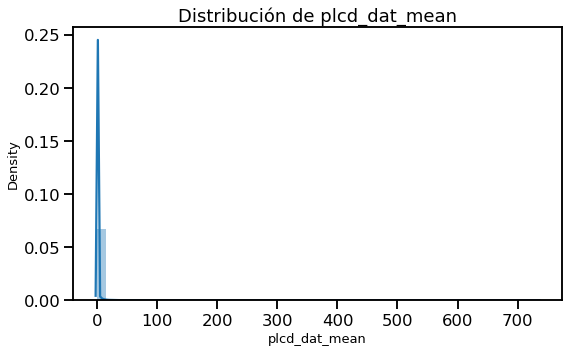

_Conclusión: La distribución de **plcd_dat_mean** muestra la concentración de valores que podrían incidir en churn._

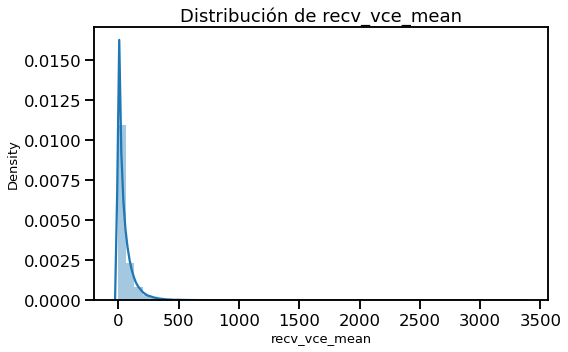

_Conclusión: La distribución de **recv_vce_mean** muestra la concentración de valores que podrían incidir en churn._

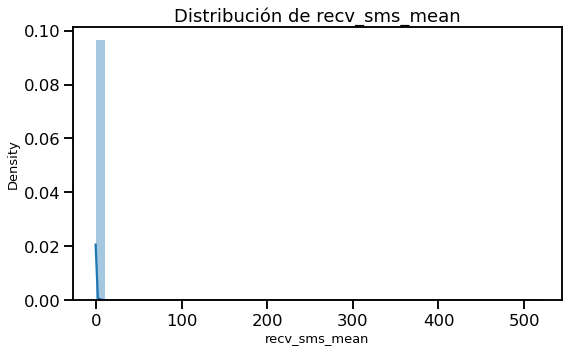

_Conclusión: La distribución de **recv_sms_mean** muestra la concentración de valores que podrían incidir en churn._

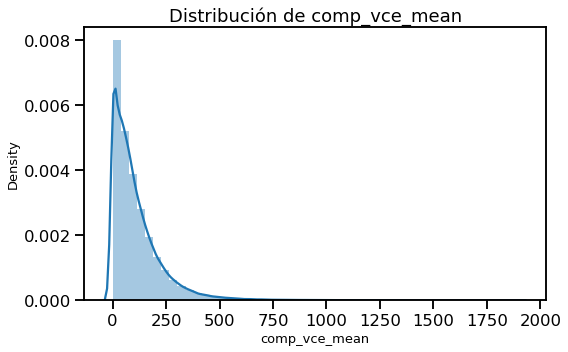

_Conclusión: La distribución de **comp_vce_mean** muestra la concentración de valores que podrían incidir en churn._

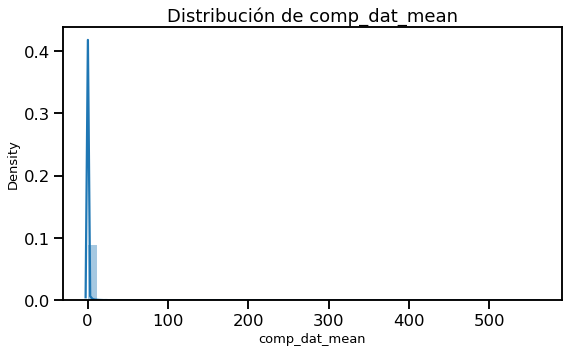

_Conclusión: La distribución de **comp_dat_mean** muestra la concentración de valores que podrían incidir en churn._

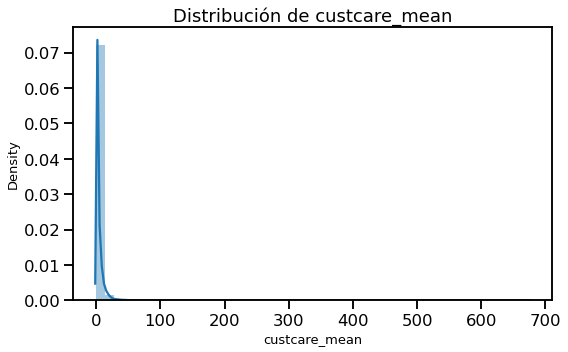

_Conclusión: La distribución de **custcare_mean** muestra la concentración de valores que podrían incidir en churn._

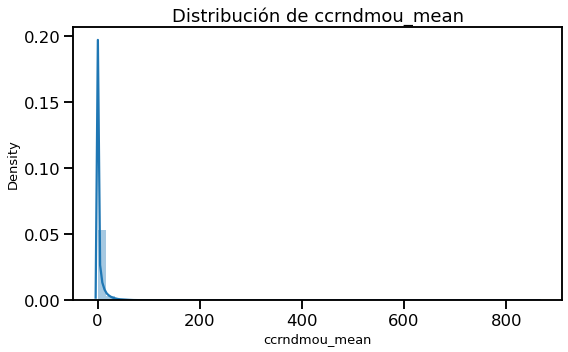

_Conclusión: La distribución de **ccrndmou_mean** muestra la concentración de valores que podrían incidir en churn._

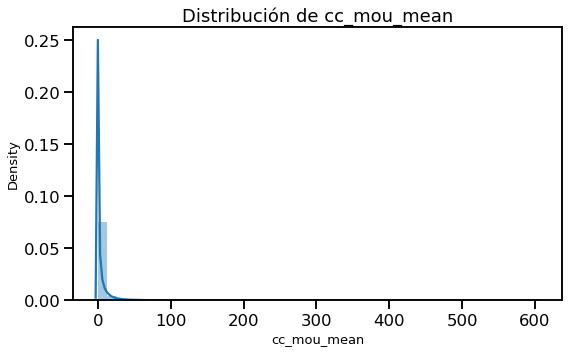

_Conclusión: La distribución de **cc_mou_mean** muestra la concentración de valores que podrían incidir en churn._

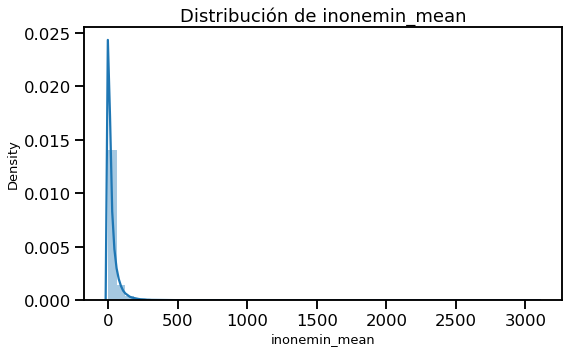

_Conclusión: La distribución de **inonemin_mean** muestra la concentración de valores que podrían incidir en churn._

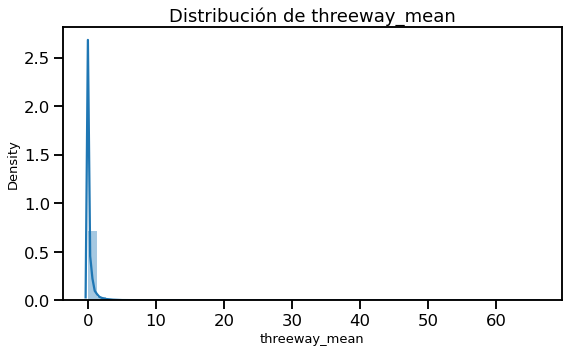

_Conclusión: La distribución de **threeway_mean** muestra la concentración de valores que podrían incidir en churn._

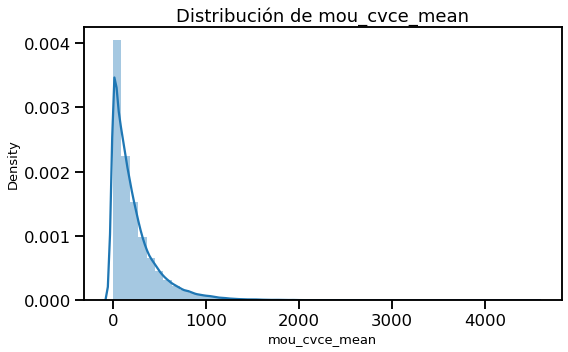

_Conclusión: La distribución de **mou_cvce_mean** muestra la concentración de valores que podrían incidir en churn._

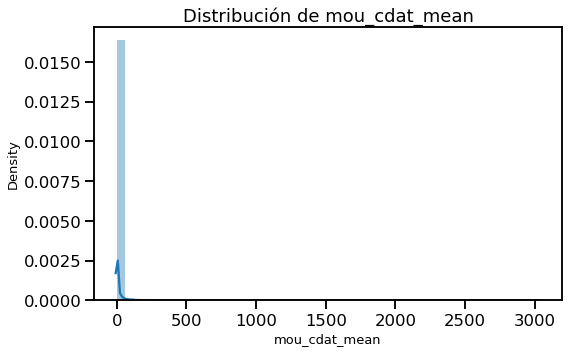

_Conclusión: La distribución de **mou_cdat_mean** muestra la concentración de valores que podrían incidir en churn._

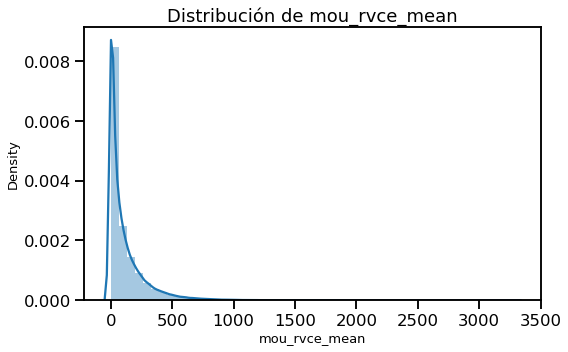

_Conclusión: La distribución de **mou_rvce_mean** muestra la concentración de valores que podrían incidir en churn._

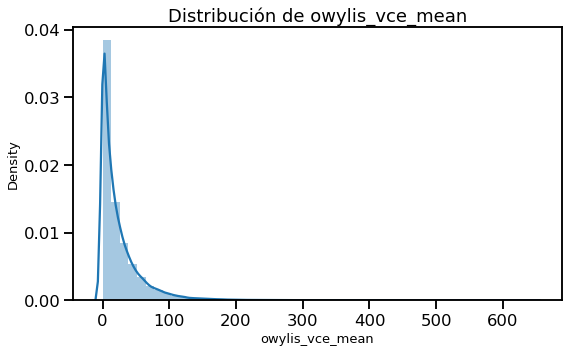

_Conclusión: La distribución de **owylis_vce_mean** muestra la concentración de valores que podrían incidir en churn._

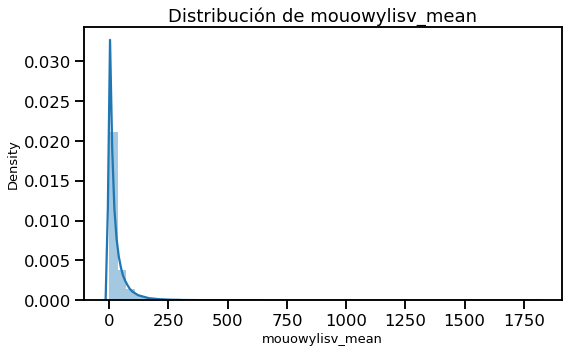

_Conclusión: La distribución de **mouowylisv_mean** muestra la concentración de valores que podrían incidir en churn._

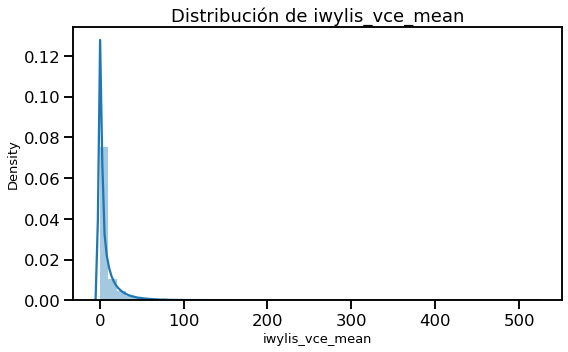

_Conclusión: La distribución de **iwylis_vce_mean** muestra la concentración de valores que podrían incidir en churn._

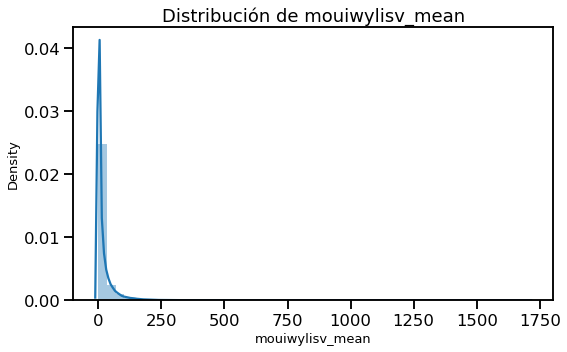

_Conclusión: La distribución de **mouiwylisv_mean** muestra la concentración de valores que podrían incidir en churn._

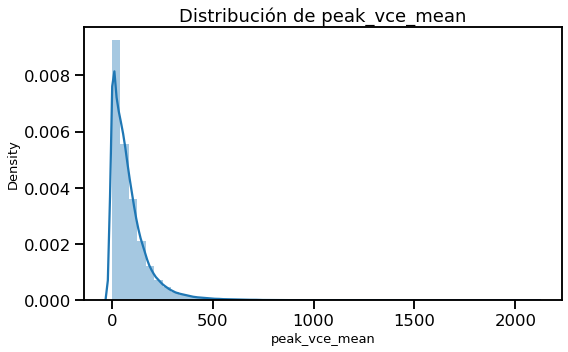

_Conclusión: La distribución de **peak_vce_mean** muestra la concentración de valores que podrían incidir en churn._

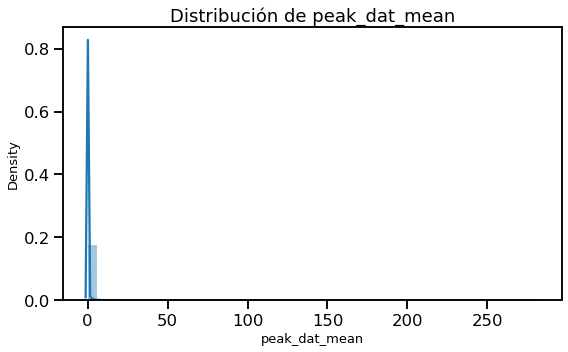

_Conclusión: La distribución de **peak_dat_mean** muestra la concentración de valores que podrían incidir en churn._

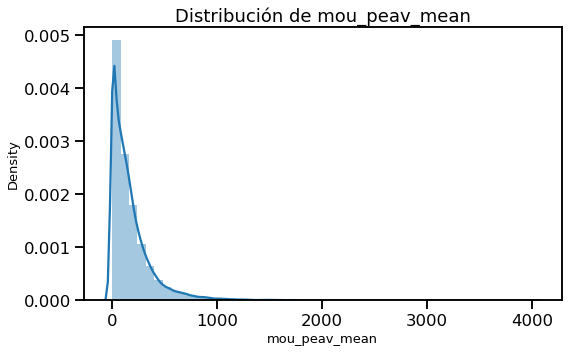

_Conclusión: La distribución de **mou_peav_mean** muestra la concentración de valores que podrían incidir en churn._

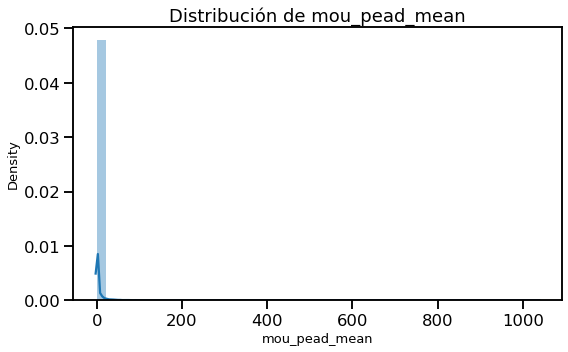

_Conclusión: La distribución de **mou_pead_mean** muestra la concentración de valores que podrían incidir en churn._

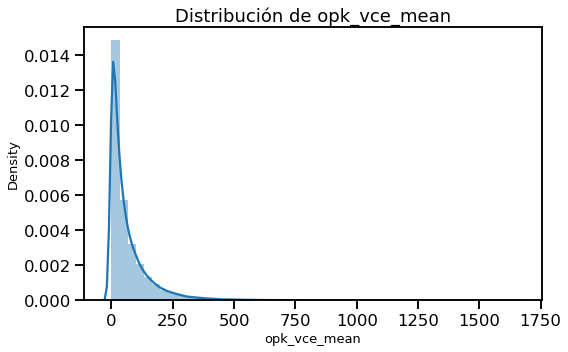

_Conclusión: La distribución de **opk_vce_mean** muestra la concentración de valores que podrían incidir en churn._

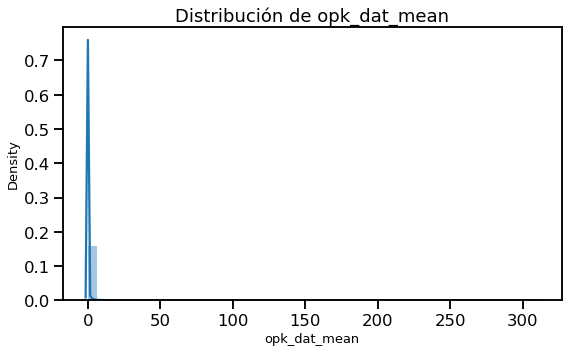

_Conclusión: La distribución de **opk_dat_mean** muestra la concentración de valores que podrían incidir en churn._

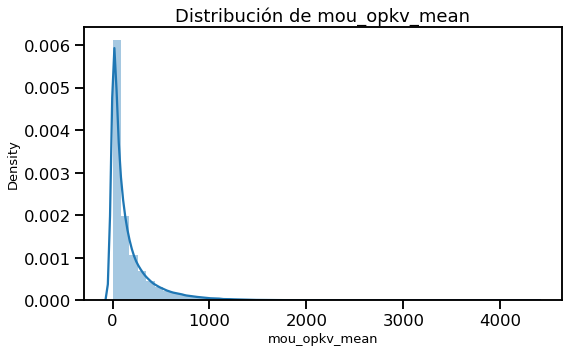

_Conclusión: La distribución de **mou_opkv_mean** muestra la concentración de valores que podrían incidir en churn._

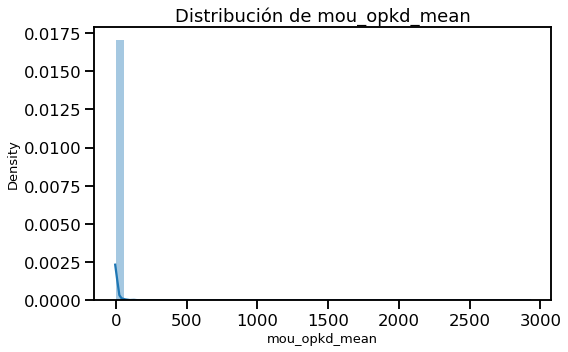

_Conclusión: La distribución de **mou_opkd_mean** muestra la concentración de valores que podrían incidir en churn._

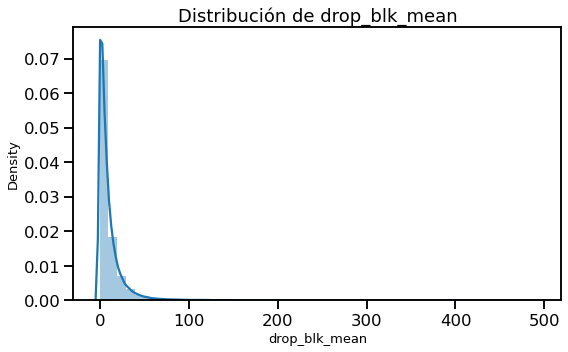

_Conclusión: La distribución de **drop_blk_mean** muestra la concentración de valores que podrían incidir en churn._

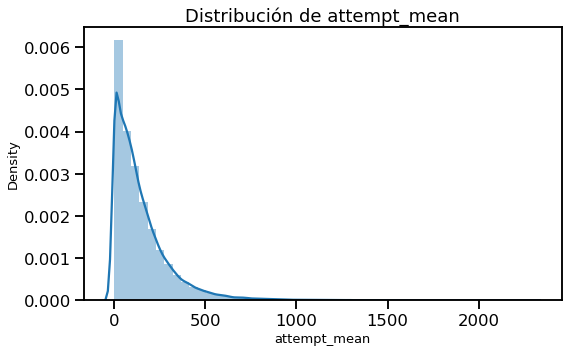

_Conclusión: La distribución de **attempt_mean** muestra la concentración de valores que podrían incidir en churn._

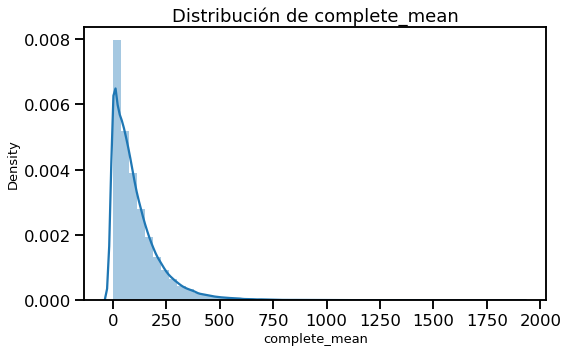

_Conclusión: La distribución de **complete_mean** muestra la concentración de valores que podrían incidir en churn._

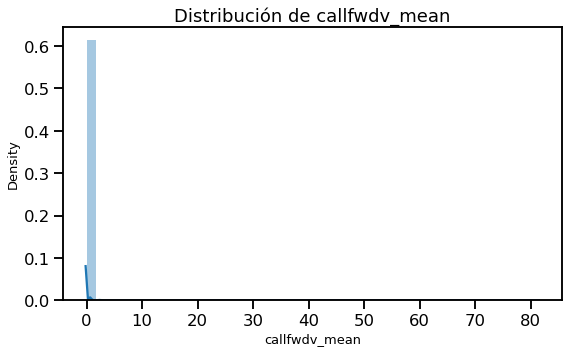

_Conclusión: La distribución de **callfwdv_mean** muestra la concentración de valores que podrían incidir en churn._

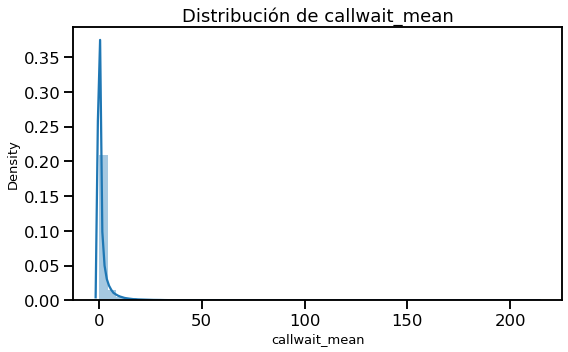

_Conclusión: La distribución de **callwait_mean** muestra la concentración de valores que podrían incidir en churn._

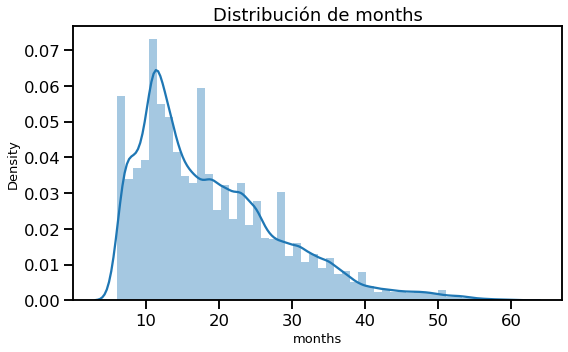

_Conclusión: La distribución de **months** muestra la concentración de valores que podrían incidir en churn._

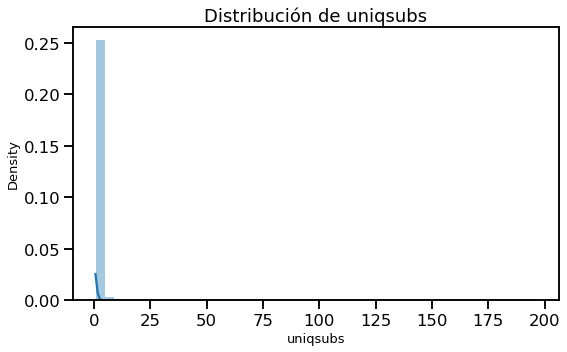

_Conclusión: La distribución de **uniqsubs** muestra la concentración de valores que podrían incidir en churn._

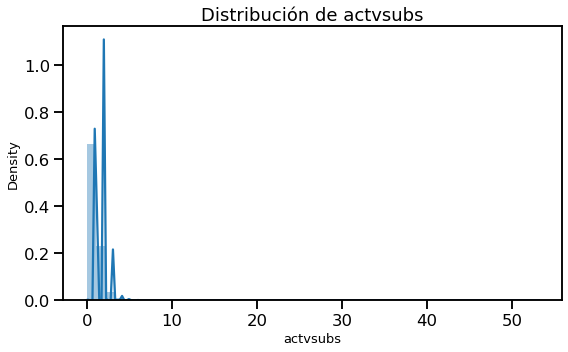

_Conclusión: La distribución de **actvsubs** muestra la concentración de valores que podrían incidir en churn._

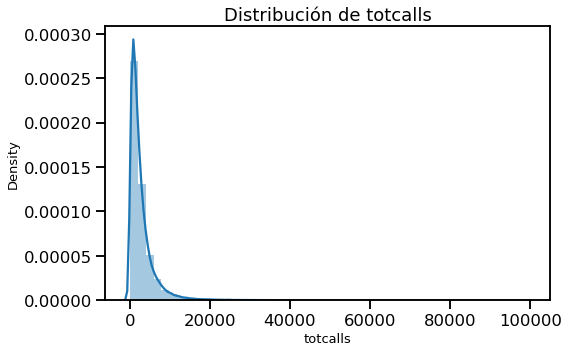

_Conclusión: La distribución de **totcalls** muestra la concentración de valores que podrían incidir en churn._

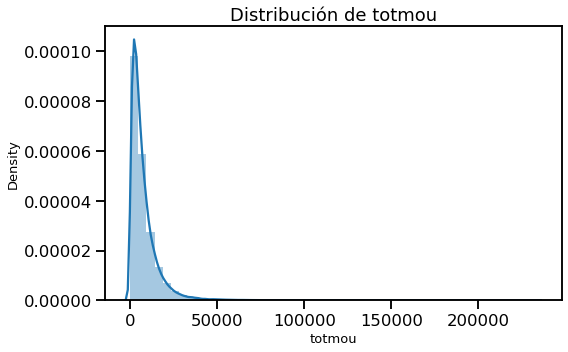

_Conclusión: La distribución de **totmou** muestra la concentración de valores que podrían incidir en churn._

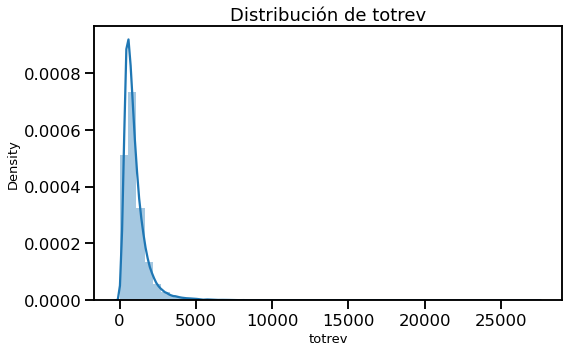

_Conclusión: La distribución de **totrev** muestra la concentración de valores que podrían incidir en churn._

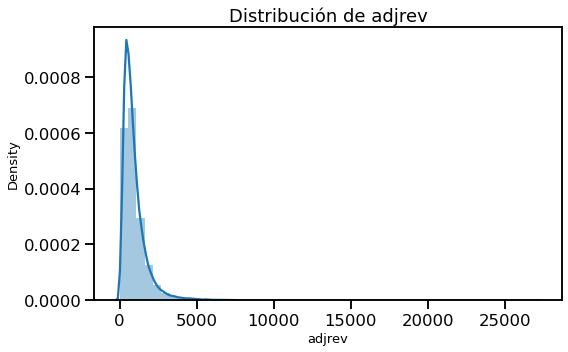

_Conclusión: La distribución de **adjrev** muestra la concentración de valores que podrían incidir en churn._

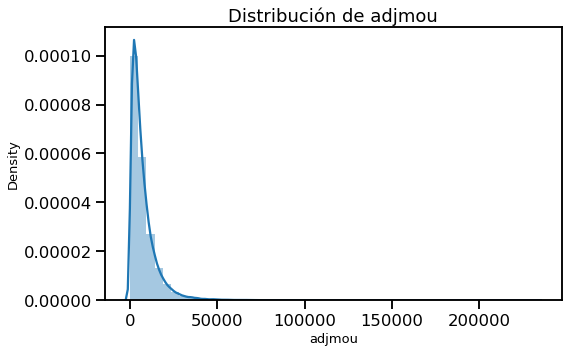

_Conclusión: La distribución de **adjmou** muestra la concentración de valores que podrían incidir en churn._

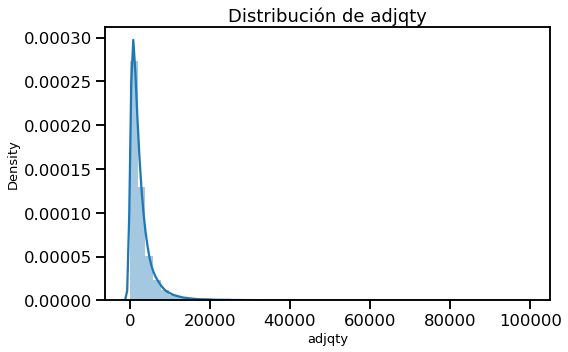

_Conclusión: La distribución de **adjqty** muestra la concentración de valores que podrían incidir en churn._

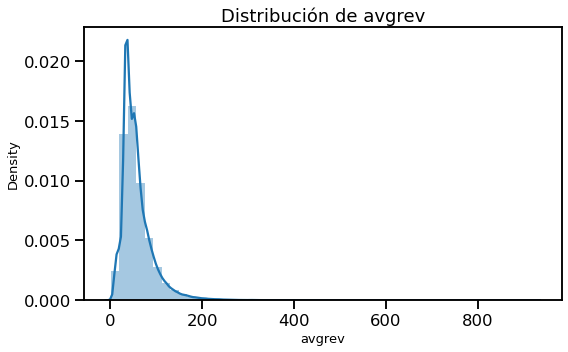

_Conclusión: La distribución de **avgrev** muestra la concentración de valores que podrían incidir en churn._

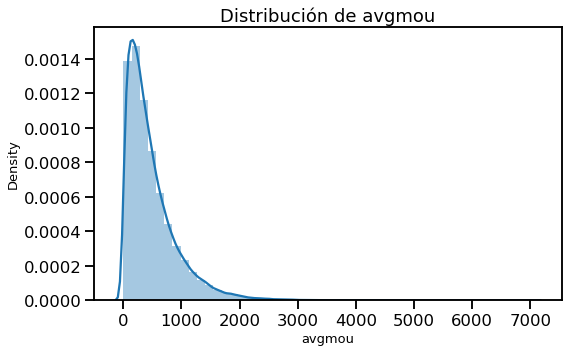

_Conclusión: La distribución de **avgmou** muestra la concentración de valores que podrían incidir en churn._

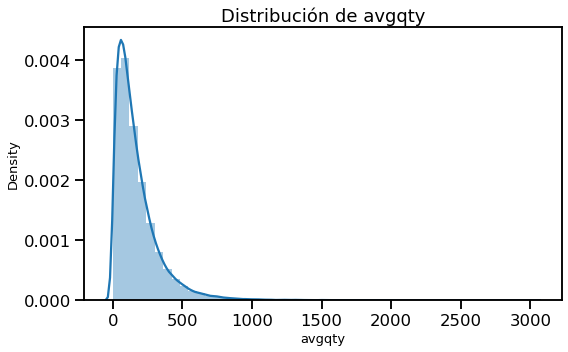

_Conclusión: La distribución de **avgqty** muestra la concentración de valores que podrían incidir en churn._

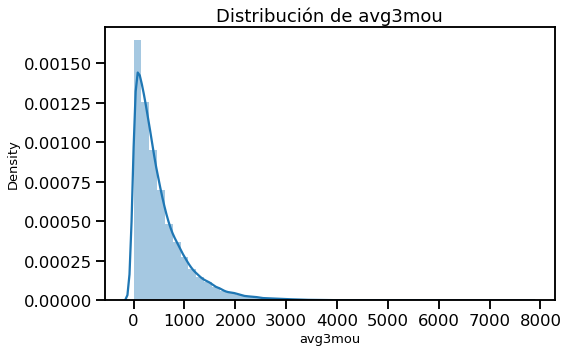

_Conclusión: La distribución de **avg3mou** muestra la concentración de valores que podrían incidir en churn._

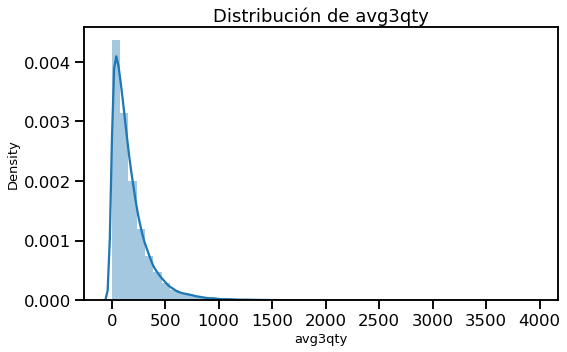

_Conclusión: La distribución de **avg3qty** muestra la concentración de valores que podrían incidir en churn._

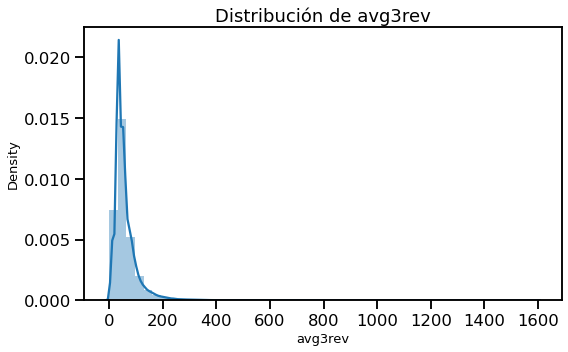

_Conclusión: La distribución de **avg3rev** muestra la concentración de valores que podrían incidir en churn._

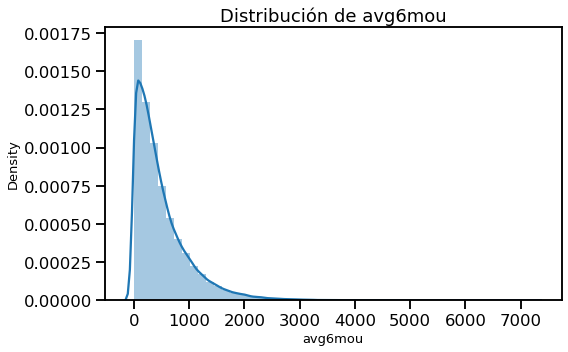

_Conclusión: La distribución de **avg6mou** muestra la concentración de valores que podrían incidir en churn._

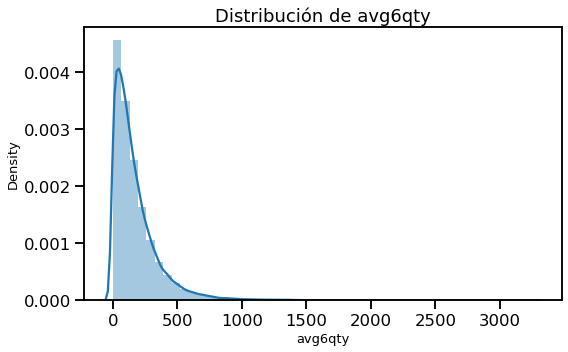

_Conclusión: La distribución de **avg6qty** muestra la concentración de valores que podrían incidir en churn._

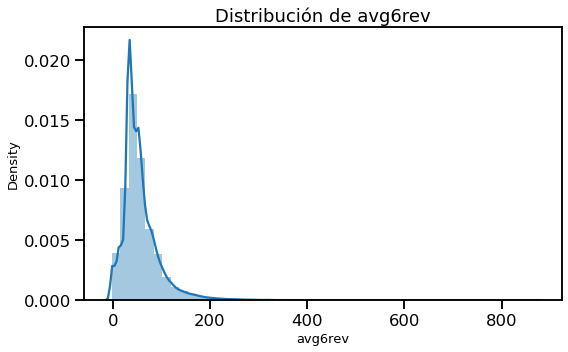

_Conclusión: La distribución de **avg6rev** muestra la concentración de valores que podrían incidir en churn._

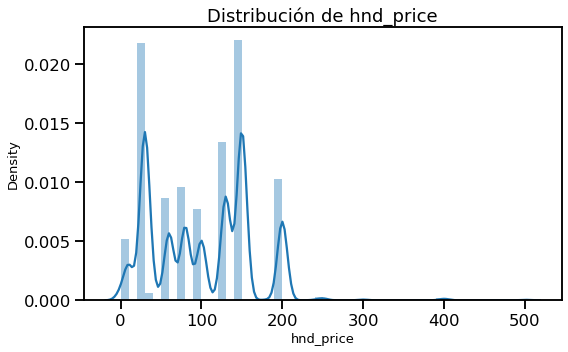

_Conclusión: La distribución de **hnd_price** muestra la concentración de valores que podrían incidir en churn._

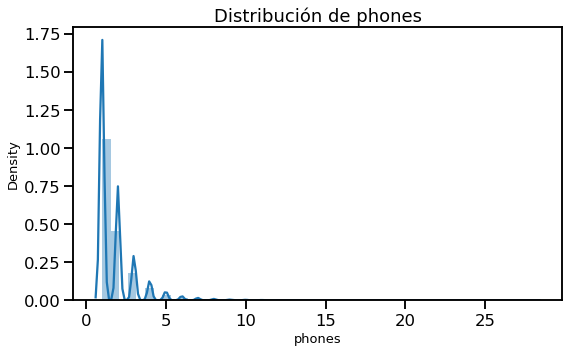

_Conclusión: La distribución de **phones** muestra la concentración de valores que podrían incidir en churn._

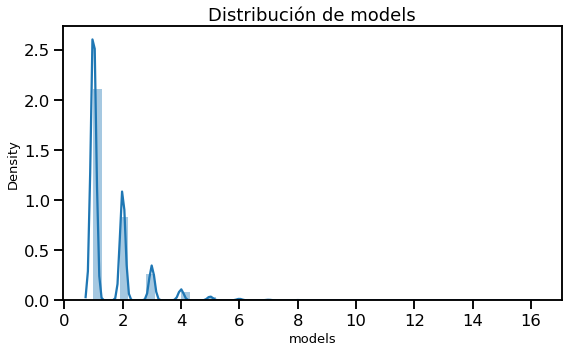

_Conclusión: La distribución de **models** muestra la concentración de valores que podrían incidir en churn._

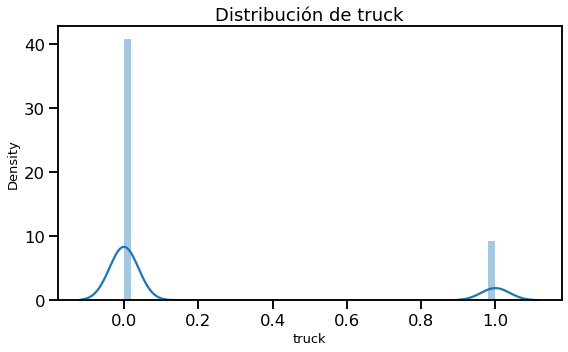

_Conclusión: La distribución de **truck** muestra la concentración de valores que podrían incidir en churn._

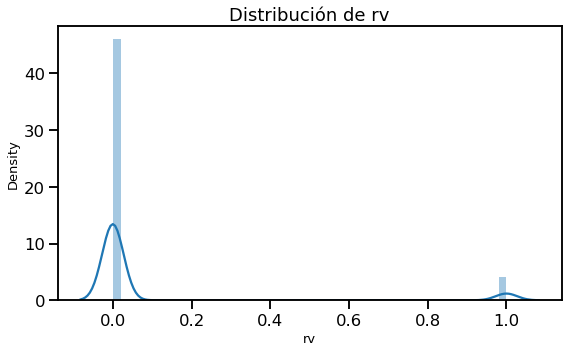

_Conclusión: La distribución de **rv** muestra la concentración de valores que podrían incidir en churn._

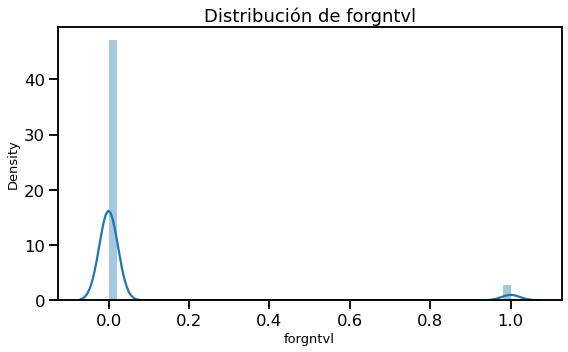

_Conclusión: La distribución de **forgntvl** muestra la concentración de valores que podrían incidir en churn._

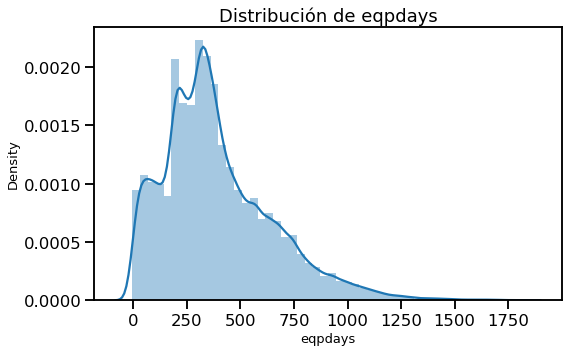

_Conclusión: La distribución de **eqpdays** muestra la concentración de valores que podrían incidir en churn._

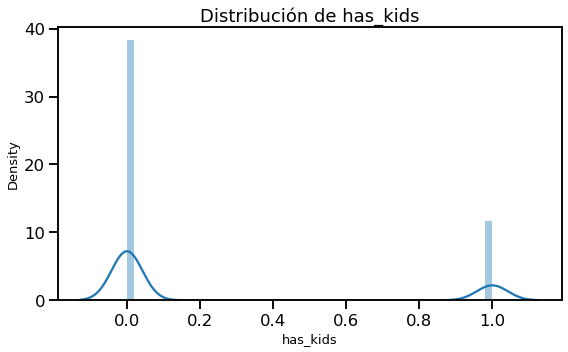

_Conclusión: La distribución de **has_kids** muestra la concentración de valores que podrían incidir en churn._

,count,mean,std,min,1%,5%,25%,50%,75%,95%,99%,max,skew,kurtosis
rev_mean,99999.0,58.510170,46.341696,-6.1675,7.774967,14.152250,33.240000,48.012500,70.630000,135.740000,227.231500,3843.262500,9.096859,477.684428
mou_mean,99999.0,511.731645,525.124087,0.0000,0.000000,15.000000,148.750000,354.000000,701.250000,1545.750000,2421.260000,12206.750000,2.313826,10.786919
totmrc_mean,99999.0,46.013866,23.741351,-26.9150,5.000000,10.000000,30.000000,44.990000,59.990000,84.990000,117.866900,409.990000,1.606170,8.903997
da_mean,99999.0,0.885664,2.174384,0.0000,0.000000,0.000000,0.000000,0.247500,0.742500,4.207500,9.652500,159.390000,10.826856,387.487427
ovrmou_mean,99999.0,40.926028,97.153608,0.0000,0.000000,0.000000,0.000000,2.750000,42.000000,195.000000,430.255000,4320.750000,7.428503,126.112406
datovr_mean,99999.0,0.260387,3.121000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.585000,5.187700,423.540000,58.110125,5591.368264
roam_mean,99999.0,1.281825,14.685364,0.0000,0.000000,0.000000,0.000000,0.000000,0.235000,5.132500,22.360400,3685.200000,169.103090,40198.128915
change_mou,99999.0,-13.809806,274.859264,-3875.0000,-834.000000,-386.750000,-86.000000,-5.500000,61.750000,343.525000,747.005000,31219.250000,14.453574,1680.253638
change_rev,99999.0,-1.011979,50.138679,-1107.7400,-104.102750,-47.713750,-7.203750,-0.290000,1.545000,47.056500,121.292800,9963.657500,80.895218,15699.052386
drop_vce_mean,99999.0,5.955145,8.954740,0.0000,0.000000,0.000000,0.666667,3.000000,7.666667,21.666667,41.340000,232.666667,4.611939,44.125960


In [12]:
# Histogramas y KDE

for col in numerical_cols:
    fig, ax = plt.subplots(figsize=(8,5))
    sns.distplot(raw_df[col].dropna(), kde=True, ax=ax, color='#1f77b4')
    ax.set_title(f"Distribución de {col}")
    ax.set_xlabel(col)
    plt.tight_layout()
    plt.show()
    display(Markdown(f"_Conclusión: La distribución de **{col}** muestra la concentración de valores que podrían incidir en churn._"))

# Resumen estadístico robusto
desc = raw_df[meta_df[(meta_df.tipo != "object") &  (meta_df.candidata == 1)]["columna"]].describe(percentiles=[0.01,0.05,0.25,0.5,0.75,0.95,0.99]).T
desc['skew'] = raw_df[meta_df[(meta_df.tipo != "object") &  (meta_df.candidata == 1)]["columna"]].skew()
desc['kurtosis'] = raw_df[meta_df[(meta_df.tipo != "object") &  (meta_df.candidata == 1)]["columna"]].kurtosis()
display(desc)


In [13]:
# v2 gestionar outliers y pintarlos?

# Outliers por regla de Tukey
outlier_summary = {}
for col in numerical_cols:
    q1, q3 = raw_df[col].quantile([0.25, 0.75])
    iqr = q3 - q1
    lower, upper = q1 - 1.5 * iqr, q3 + 1.5 * iqr
    share = ((raw_df[col] < lower) | (raw_df[col] > upper)).mean()
    outlier_summary[col] = share

display(pd.Series(outlier_summary, name='tasa_outliers').sort_values(ascending=False))

change_rev         0.263233
has_kids           0.233382
roam_mean          0.189142
truck              0.185552
plcd_dat_mean      0.149801
callwait_mean      0.143051
cc_mou_mean        0.142651
change_mou         0.137681
datovr_mean        0.136731
da_mean            0.136431
ccrndmou_mean      0.134561
mou_cdat_mean      0.133931
comp_dat_mean      0.133931
custcare_mean      0.127101
vceovr_mean        0.116011
ovrmou_mean        0.115271
ovrrev_mean        0.113861
mouiwylisv_mean    0.113161
blck_vce_mean      0.107011
iwylis_vce_mean    0.103631
mou_opkd_mean      0.096181
opk_dat_mean       0.096061
peak_dat_mean      0.089421
mou_pead_mean      0.089401
threeway_mean      0.086601
phones             0.084111
mouowylisv_mean    0.083841
mou_opkv_mean      0.083041
inonemin_mean      0.081511
rv                 0.081151
drop_blk_mean      0.076131
mou_rvce_mean      0.072011
drop_vce_mean      0.071431
opk_vce_mean       0.071421
adjqty             0.071141
totcalls           0

In [14]:
## v2 - considerar transformaciones the variables dependiendo de sus propiedades estadisticas - log ... ???????????

def decide_actions(row):
    col = row.name
    acts = []

    # A) baja varianza o rango nulo
    if (row['std'] is not None and row['std'] < 1e-8) or (row['min'] == row['max']):
        return dict(transform=None, capping=None, zero_flag=False, drop_reason="Varianza nula")

    # B) ceros masivos
    zero_inflated = (row['5%'] == 0) and (row['75%'] > 0)
    
    # C) Outliers
    out_s = row['outlier_share'] if pd.notnull(row['outlier_share']) else 0.0
    if out_s >= 0.20:
        cap = (0.005, 0.995)  # muy agresivo
    elif out_s >= 0.05:
        cap = (0.01, 0.99)    # moderado
    else:
        cap = None

    # D) Transformación por asimetría y colas
    skew = row['skew']; kurt = row['kurtosis']; minv = row['min']
    transform = None
    if abs(skew) > 1 or kurt > 10:
        if minv >= 0:
            # si hay cola derecha fuerte y valores no negativos, log1p suele funcionar
            transform = "log1p"
        else:
            # datos con negativos, usar YeoJohnson
            transform = "yeojohnson"

    # E) variables claramente discretas binarias o enteros de conteo pequeños
    # si máx <= 1 y min >= 0, no aplicar transform, excepto capping si toca
    if row['max'] <= 1 and row['min'] >= 0:
        transform = None

    return dict(transform=transform, capping=cap, zero_flag=zero_inflated, drop_reason=None)



In [15]:
# v2 - agrupacion/tratamiento de varaibles categoricas
# v2 - relacion entre variables categoricas por pares (Matriz Cramers)

cat_summary_list = []
categorical_cols = [c for c in categorical_cols if c != ID_COL]

for col in categorical_cols:
    temp = raw_df.groupby(col)[TARGET].agg(['mean','size']).sort_values('mean', ascending=False)
    temp['columna'] = col
    cat_summary_list.append(temp.reset_index())

if cat_summary_list:
    cat_summary = pd.concat(cat_summary_list, ignore_index=True)

    for col in cat_summary['columna'].unique():
        df_aux = cat_summary[cat_summary['columna'] == col]

        fig = px.bar(
            df_aux,
            x=col,
            y='mean',
            color='size',
            title=f"Tasa de churn promedio por categoría: {col}",
            text='mean',
            height=500
        )
        fig.update_traces(texttemplate='%{text:.2f}', textposition='outside')
        fig.update_layout(showlegend=False, yaxis_title="Tasa promedio de churn")
        fig.show()

    display(Markdown("_Conclusión: Las categorías con mayor tasa de churn orientan campañas de retención específicas._"))

else:
    print("No hay columnas categóricas disponibles para el análisis.")

_Conclusión: Las categorías con mayor tasa de churn orientan campañas de retención específicas._

## 5. Análisis bivariado y multivariado
Contrastamos cada variable con la etiqueta para medir su impacto estadístico y evaluamos interacciones, correlaciones, VIF y riesgos de redundancia.

In [16]:
# Cramer's V para categóricas
cramers_results = []
for col in categorical_cols:
    try:
        cv = cramers_v(raw_df[col], raw_df[TARGET])
    except Exception:
        cv = np.nan
    cramers_results.append({'variable': col, 'cramers_v': cv})

if cramers_results:
    display(pd.DataFrame(cramers_results).sort_values('cramers_v', ascending=False))

,variable,cramers_v
2,asl_flag,0.069378
7,hnd_webcap,0.052485
6,refurb_new,0.031598
5,dualband,0.030991
13,infobase,0.020857
10,dwlltype,0.017058
8,ownrent,0.015775
18,ethnic,0.015436
11,marital,0.012502
24,creditcd,0.011793


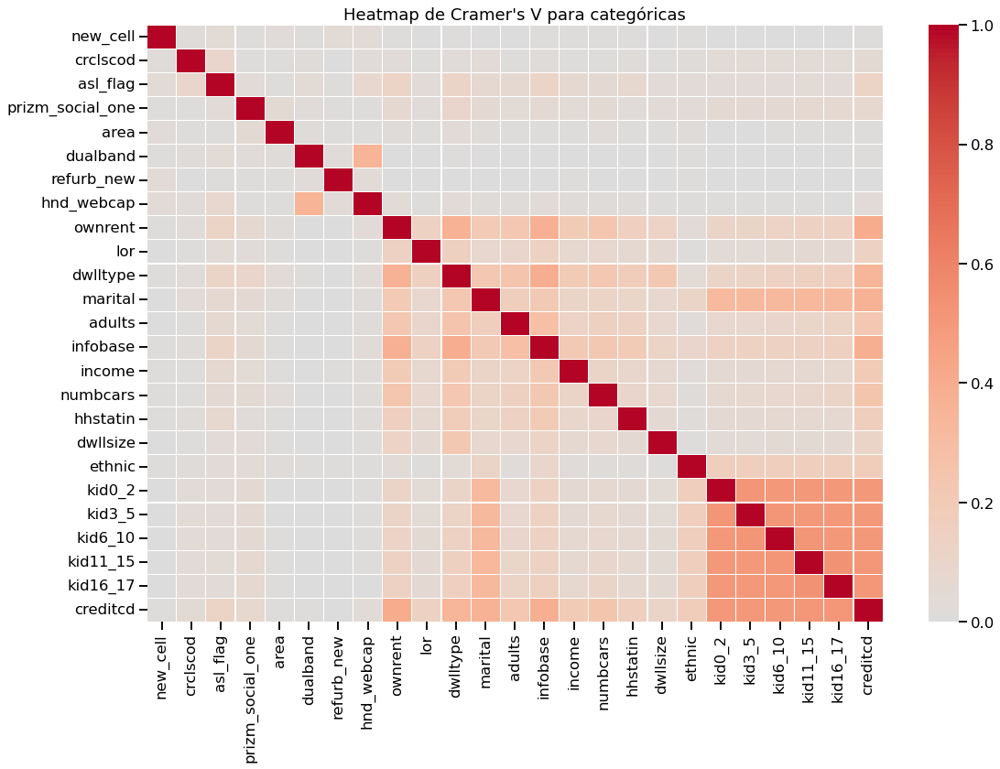

_Conclusión: Identifica pares de variables categóricas altamente correlacionadas para evitar redundancias._

kid11_15  kid16_17    0.533113
kid6_10   kid11_15    0.523410
kid0_2    kid3_5      0.520244
kid3_5    kid6_10     0.519407
kid16_17  creditcd    0.509620
kid11_15  creditcd    0.508899
kid6_10   creditcd    0.507698
kid3_5    creditcd    0.504091
kid0_2    creditcd    0.503093
          kid6_10     0.502563
kid6_10   kid16_17    0.501963
kid3_5    kid11_15    0.500708
kid0_2    kid11_15    0.500056
kid3_5    kid16_17    0.500016
kid0_2    kid16_17    0.500011
dtype: float64


In [17]:
cramers_matrix = pd.DataFrame(
    np.ones((len(categorical_cols), len(categorical_cols))),
    index=categorical_cols,
    columns=categorical_cols
)

for i, col1 in enumerate(categorical_cols):
    for j, col2 in enumerate(categorical_cols):
        if i < j:  # calcula solo una vez
            try:
                val = cramers_v(raw_df[col1], raw_df[col2])
            except Exception:
                val = np.nan
            cramers_matrix.loc[col1, col2] = val
            cramers_matrix.loc[col2, col1] = val

# Heatmap de cramer

plt.figure(figsize=(18, 12))
sns.heatmap(cramers_matrix, cmap='coolwarm', center=0, linewidths=0.1)
plt.title("Heatmap de Cramer's V para categóricas")
plt.show()
display(Markdown("_Conclusión: Identifica pares de variables categóricas altamente correlacionadas para evitar redundancias._"))

corr_pairs = cramers_matrix.unstack()
corr_pairs = corr_pairs.drop_duplicates().dropna()
high_corr = corr_pairs[(abs(corr_pairs) < 1)]
high_corr_pairs = high_corr.sort_values(ascending=False)

print(high_corr_pairs[high_corr_pairs > 0.5])

In [18]:
# Comparativa numéricas vs target
bivariate_stats = []
for col in numerical_cols:
    churn_vals = raw_df.loc[raw_df[TARGET]==1, col].dropna()
    nochurn_vals = raw_df.loc[raw_df[TARGET]==0, col].dropna()
    if len(churn_vals) < 10 or len(nochurn_vals) < 10:
        continue
    try:
        stat, pval = stats.mannwhitneyu(churn_vals, nochurn_vals, alternative='two-sided')
        test = 'Mann-Whitney'
    except ValueError:
        stat, pval, test = np.nan, np.nan, 'N/A'
    bivariate_stats.append({
        'variable': col,
        'test': test,
        'stat': stat,
        'pvalue': pval
    })

bivariate_df = pd.DataFrame(bivariate_stats)
display(bivariate_df.sort_values('pvalue'))


# Ninguna variable categórica aislada explica bien el churn (Cramér’s V bajo en todas). Crames < 0.3 .
# Aun así, asl_flag, hnd_webcap, refurb_new y dualband muestran el mayor potencial, por lo que deberían priorizarse.
valid_num = [c for c in numerical_cols if c in list(meta_df[meta_df['candidata']==1]['columna'])]

# VIF en variables numéricas relevantes
if len(valid_num) > 1:
    vif_df = vif_report(raw_df[valid_num])
    display(vif_df.sort_values('vif'))

,variable,test,stat,pvalue
72,eqpdays,Mann-Whitney,1.434801e+09,0.000000e+00
66,hnd_price,Mann-Whitney,1.111582e+09,4.045817e-207
2,totmrc_mean,Mann-Whitney,1.141116e+09,5.715916e-126
41,mou_opkv_mean,Mann-Whitney,1.146687e+09,2.854721e-113
28,mou_cvce_mean,Mann-Whitney,1.148141e+09,3.902289e-110
1,mou_mean,Mann-Whitney,1.148412e+09,1.704987e-109
33,iwylis_vce_mean,Mann-Whitney,1.159425e+09,6.154688e-90
34,mouiwylisv_mean,Mann-Whitney,1.160792e+09,2.925071e-87
45,complete_mean,Mann-Whitney,1.160923e+09,1.187690e-84
39,opk_vce_mean,Mann-Whitney,1.160969e+09,1.380673e-84


,feature,vif
41,forgntvl,1.019443
43,has_kids,1.098203
16,threeway_mean,1.198000
37,hnd_price,1.309103
3,da_mean,1.372958
5,datovr_mean,1.373750
40,rv,1.638769
26,mou_opkd_mean,1.698069
39,truck,1.724935
7,change_mou,1.991732


In [19]:
meta_df = meta_df.merge(vif_df.rename(columns={'feature':'columna','vif':'vif'}),on='columna', how='left')

mw_df = bivariate_df.rename(columns={'variable':'columna','stat':'mw_stat','pvalue':'mw_pvalue'})
meta_df = meta_df.merge(mw_df[['columna','mw_stat','mw_pvalue']], on='columna', how='left')

high_vif_keep_mask = (meta_df['vif'] >= 10) & (meta_df['candidata'] == 1)
high_vif_cols = meta_df.loc[high_vif_keep_mask, 'columna'].dropna().unique().tolist()


In [20]:
vif_df = vif_report(raw_df[[c for c in valid_num if 
                            c not in ['blck_vce_mean', 'drop_vce_mean', 'avgrev', 'adjmou', 'avgqty', 'opk_vce_mean', 'has_kids']]])
display(vif_df.sort_values('vif'))

,feature,vif
36,forgntvl,1.008823
14,threeway_mean,1.195054
32,hnd_price,1.308429
3,da_mean,1.369649
5,datovr_mean,1.373381
35,rv,1.638431
34,truck,1.653329
23,mou_opkd_mean,1.685406
24,drop_blk_mean,1.698393
10,plcd_dat_mean,1.851356


In [21]:
# Esenciales de negocio a considerar para mantener (ancla interpretables)
BUSINESS_WHITELIST = {
    'rev_mean','mou_mean','totmrc_mean','totrev', # anclas de negocio aunque tengan VIF alto
    'change_mou','change_rev', # dinámica (valor de negocio)
    'months','uniqsubs','actvsubs', # tamaño/antiguedad de cuenta
    'eqpdays','hnd_price','models','hnd_webcap', # equipamiento / calidad datos
    'drop_blk_mean', #representante fallos voz
    'mou_opkv_mean' # alternativa con VIF más bajo que opk_vce_mean
}

DROP_EXPLICIT = {
    'avgrev','adjmou','avgqty',                   # agregados derivados redundantes
    'blck_vce_mean','drop_vce_mean',              # redundantes vs drop_blk_mean
    'opk_vce_mean',                               # VIF alto; mantenemos mou_opkv_mea
}

mask_drop_exp = meta_df['columna'].isin(DROP_EXPLICIT)
meta_df.loc[mask_drop_exp, 'candidata'] = 0
meta_df.loc[mask_drop_exp, 'motivo'] = 'Descartada por redundancia a partir del VIF'

DROP_EXPLICIT = {
    'truck','rv','has_kids',                   # MW no signiticativas
    'numbcars','forgntvl'
}

mask_drop_exp = meta_df['columna'].isin(DROP_EXPLICIT)
meta_df.loc[mask_drop_exp, 'candidata'] = 0
meta_df.loc[mask_drop_exp, 'motivo'] = 'Descartada por falta de significatividad a partr de MW'


In [22]:
meta_df

,columna,tipo,nulos_%,descripcion,candidata,motivo,feature_x,feature_y,mutual_info,relevancia_preliminar,vif,mw_stat,mw_pvalue
0,rev_mean,float64,0.0036,Mean monthly revenue (charge amount),1,,NaN,rev_mean,0.004442,Crítica,15.351058,1.209039e+09,3.615389e-19
1,mou_mean,float64,0.0036,Mean number of monthly minutes of use,1,,NaN,mou_mean,0.007318,Crítica,13.430783,1.148412e+09,1.704987e-109
2,totmrc_mean,float64,0.0036,Mean total monthly recurring charge,1,,NaN,totmrc_mean,0.010459,Crítica,4.291148,1.141116e+09,5.715916e-126
3,da_mean,float64,0.0036,Mean number of directory assisted calls,1,,NaN,da_mean,0.004579,Crítica,1.372958,1.216865e+09,1.294590e-14
4,ovrmou_mean,float64,0.0036,Mean overage minutes of use,1,,NaN,ovrmou_mean,0.003182,Crítica,6.985141,1.277472e+09,2.968608e-10
5,ovrrev_mean,float64,0.0036,Mean overage revenue,0,Variable alttamente correlacionada (0.85) con ...,NaN,ovrrev_mean,0.000000,Baja,NaN,1.277178e+09,4.596429e-10
6,vceovr_mean,float64,0.0036,Mean revenue of voice overage,0,Variable alttamente correlacionada (0.85) con ...,NaN,vceovr_mean,0.002720,Alta,NaN,1.283412e+09,7.532418e-15
7,datovr_mean,float64,0.0036,Mean revenue of data overage,1,,NaN,datovr_mean,0.001400,Alta,1.373750,1.229407e+09,5.843404e-14
8,roam_mean,float64,0.0036,Mean number of roaming calls,1,,NaN,roam_mean,0.001637,Alta,2.540056,1.241780e+09,3.033704e-02
9,change_mou,float64,0.0089,Percentage change in monthly minutes of use vs...,1,,NaN,change_mou,0.007628,Crítica,1.991732,1.177075e+09,2.774998e-57


## 6. Preprocesado reproducible
Construimos un pipeline de sklearn con imputación, escalado y codificación apropiados, cuidando de evitar fuga de información.

In [23]:
# Separación de variables
X = raw_df.drop(columns=[TARGET])
y = raw_df.loc[:,TARGET].astype(int)

num_features = [c for c in list(meta_df[(meta_df['candidata']==1)&(meta_df['tipo']!='object')]['columna'])]
cat_features = [c for c in list(meta_df[(meta_df['candidata']==1)&(meta_df['tipo']=='object')]['columna'])]

#one_hot_features = ["new_cell", "asl_flag", "prizm_social_one", "dualband", "refurb_new", "hnd_webcap", "ownrent", "marital", "infobase", "creditcd", "kid0_2", "kid3_5", "kid6_10", "kid11_15", "kid16_17"]
#target_enc_features = ["crclscod", "area", "dwlltype", "hhstatin", "dwllsize", "ethnic"]
#ord_bin_features = ["lor", "income", "numbcars", "adults"]

one_hot_features, target_enc_features, ordinal_features = classify_encoding(X, cat_features, low_cardinality_threshold=10, rare_threshold=0.01)

passthrough_features = [c for c in num_features if X[c].nunique()<20]
pre_proc_features = [c for c in num_features if c not in passthrough_features]

print("Todas las variables numéricas incluídas: ", len(cat_features) == (len(one_hot_features) + len(target_enc_features) + len(ordinal_features)))
print("Todas las variables categoricas incluídas: ", len(num_features) == (len(passthrough_features) +len(pre_proc_features)))
       
numeric_imputer = IterativeImputer(random_state=RANDOM_SEED, sample_posterior=True)
categorical_imputer = SimpleImputer(strategy="most_frequent")

numeric_pipeline = Pipeline([
    ('imputer', numeric_imputer),
    ('scaler', StandardScaler())
])

categorical_ohe_pipeline = Pipeline([
    ('imputer', categorical_imputer),
    ('encoder', OneHotEncoder(handle_unknown='ignore'))
])

categorical_te_pipeline = Pipeline([
        ("imputer", categorical_imputer),
        ("encoder", TargetEncoder(smoothing=0.3, min_samples_leaf=20))
])

categorical_ord_pipeline = Pipeline([
#     ("neg1_to_nan", FunctionTransformer(lambda df: df.replace(-1, np.nan))),
    ("to_numeric", FunctionTransformer(lambda df: pd.to_numeric(df.stack(), errors="coerce").unstack().fillna(-1))),
    ("imputer", categorical_imputer),   # opcional si quieres imputar antes
    ("encoder", OrdinalEncoder(handle_unknown='use_encoded_value',  unknown_value=-1))
])

preprocessor = ColumnTransformer([
    ('num', numeric_pipeline, pre_proc_features),
    ('num_passthrough', 'passthrough', passthrough_features),
    ('cat_ohe', categorical_ohe_pipeline, one_hot_features),
    ('cat_te', categorical_te_pipeline, target_enc_features),
    ('cat_ord', categorical_ord_pipeline, ordinal_features)
])


X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=TEST_SIZE, stratify=y, random_state=RANDOM_SEED
)

print(f"Train: {X_train.shape}, Test: {X_test.shape}")

Todas las variables numéricas incluídas:  True
Todas las variables categoricas incluídas:  True
Train: (79999, 99), Test: (20000, 99)


In [24]:
# Nota rapida de justificacion en tu propio flujo
print("Notas")
print("    standard, buena si la distribucion es simetrica tras controlar outliers")
print("    robust, usa mediana y IQR, protege frente a colas largas, recomendado en telco")
print("    minmax, conserva rangos, util para modelos sensibles a magnitudes, requiere control de outliers")
print("  Winsorizacion:", USE_WINSOR, "porque reduce varianza espuria sin perder filas; preferible a eliminar outliers")

Notas
    standard, buena si la distribucion es simetrica tras controlar outliers
    robust, usa mediana y IQR, protege frente a colas largas, recomendado en telco
    minmax, conserva rangos, util para modelos sensibles a magnitudes, requiere control de outliers
  Winsorizacion: True porque reduce varianza espuria sin perder filas; preferible a eliminar outliers


## 7. Modelos base y evaluación
Entrenamos varios modelos (logística, árboles, ensembles) con validación cruzada estratificada y seleccionamos al campeón priorizando PR AUC y calibración.

In [25]:
models = []

logistic = Pipeline([
    ('preprocess', preprocessor),
    ('clf', LogisticRegression(penalty='elasticnet', solver='saga', l1_ratio=0.5, C=1.0, max_iter=1000, class_weight='balanced', random_state=RANDOM_SEED))
])
models.append(('LogisticRegression', logistic))

rf = Pipeline([
    ('preprocess', preprocessor),
    ('clf', RandomForestClassifier(n_estimators=200, max_depth=None, min_samples_leaf=20, n_jobs=-1, class_weight='balanced', random_state=RANDOM_SEED))
])
models.append(('RandomForest', rf))

gb = Pipeline([
    ('preprocess', preprocessor),
    ('clf', GradientBoostingClassifier(random_state=RANDOM_SEED))
])
models.append(('GradientBoosting', gb))

lgb_model = Pipeline([
    ('preprocess', preprocessor),
    ('clf', lgb.LGBMClassifier(n_estimators=200, learning_rate=0.05, subsample=0.8, colsample_bytree=0.8, random_state=RANDOM_SEED))
])
models.append(('LightGBM', lgb_model))

catboost_model = Pipeline([
    ('preprocess', preprocessor),
    ('clf', CatBoostClassifier(verbose=0, random_state=RANDOM_SEED, depth=6, learning_rate=0.05, loss_function='Logloss'))
])
models.append(('CatBoost', catboost_model))

cv = StratifiedKFold(n_splits=CV_FOLDS, shuffle=True, random_state=RANDOM_SEED)
results = []
for name, model in models:
    scores = cross_validate(
        model,
        X_train,
        y_train,
        cv=cv,
        scoring=['roc_auc', 'average_precision', 'neg_log_loss', 'neg_brier_score', 'accuracy'],
        n_jobs=None,
        error_score='raise',
        return_estimator=False,
        verbose=10
    )
    res = {
        'model': name,
        'roc_auc_mean': scores['test_roc_auc'].mean(),
        'pr_auc_mean': scores['test_average_precision'].mean(),
        'log_loss_mean': -scores['test_neg_log_loss'].mean(),
        'brier_score_mean': scores['test_neg_brier_score'].mean(),
        'accuracy_mean': scores['test_accuracy'].mean()
    }
    print(res)
    results.append(res)

results_df = pd.DataFrame(results).sort_values('pr_auc_mean', ascending=False)
display(results_df)
SUMMARY_STORE['model_results_cv'] = results_df.to_dict(orient='records')

champion_name = results_df.iloc[0]['model']
print(f"Modelo campeón preliminar: {champion_name}")

champion_model = dict(models)[champion_name]
champion_model.fit(X_train, y_train)

# Probabilidades y métricas en test
y_prob = champion_model.predict_proba(X_test)[:,1]
y_pred = (y_prob >= 0.5).astype(int)
metrics_summary = {
    'roc_auc': roc_auc_score(y_test, y_prob),
    'pr_auc': average_precision_score(y_test, y_prob),
    'log_loss': log_loss(y_test, y_prob),
    'brier': brier_score_loss(y_test, y_prob)
}
SUMMARY_STORE['champion_metrics'] = metrics_summary
print(metrics_summary)

[CV] START .....................................................................
[CV] END  accuracy: (test=0.588) average_precision: (test=0.591) neg_brier_score: (test=-0.240) neg_log_loss: (test=-0.673) roc_auc: (test=0.618) total time= 2.0min


[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:  2.0min


[CV] START .....................................................................
[CV] END  accuracy: (test=0.588) average_precision: (test=0.596) neg_brier_score: (test=-0.239) neg_log_loss: (test=-0.672) roc_auc: (test=0.620) total time= 1.9min
[CV] START .....................................................................
[CV] END  accuracy: (test=0.584) average_precision: (test=0.589) neg_brier_score: (test=-0.240) neg_log_loss: (test=-0.673) roc_auc: (test=0.615) total time= 1.9min
[CV] START .....................................................................
[CV] END  accuracy: (test=0.587) average_precision: (test=0.591) neg_brier_score: (test=-0.240) neg_log_loss: (test=-0.674) roc_auc: (test=0.615) total time= 1.9min


[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:  7.7min


[CV] START .....................................................................
[CV] END  accuracy: (test=0.583) average_precision: (test=0.590) neg_brier_score: (test=-0.240) neg_log_loss: (test=-0.674) roc_auc: (test=0.614) total time= 1.9min
{'model': 'LogisticRegression', 'roc_auc_mean': 0.6165469928372813, 'pr_auc_mean': 0.5912941214535211, 'log_loss_mean': 0.6730691281645261, 'brier_score_mean': -0.2399557272231015, 'accuracy_mean': 0.5860697856116007}
[CV] START .....................................................................
[CV] END  accuracy: (test=0.631) average_precision: (test=0.671) neg_brier_score: (test=-0.225) neg_log_loss: (test=-0.641) roc_auc: (test=0.687) total time=  50.5s


[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   50.5s


[CV] START .....................................................................
[CV] END  accuracy: (test=0.629) average_precision: (test=0.664) neg_brier_score: (test=-0.226) neg_log_loss: (test=-0.643) roc_auc: (test=0.682) total time=  51.0s
[CV] START .....................................................................
[CV] END  accuracy: (test=0.632) average_precision: (test=0.663) neg_brier_score: (test=-0.226) neg_log_loss: (test=-0.642) roc_auc: (test=0.683) total time=  50.6s
[CV] START .....................................................................
[CV] END  accuracy: (test=0.626) average_precision: (test=0.660) neg_brier_score: (test=-0.227) neg_log_loss: (test=-0.645) roc_auc: (test=0.678) total time=  50.7s


[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:  3.4min


[CV] START .....................................................................
[CV] END  accuracy: (test=0.626) average_precision: (test=0.662) neg_brier_score: (test=-0.226) neg_log_loss: (test=-0.643) roc_auc: (test=0.679) total time=  51.3s
{'model': 'RandomForest', 'roc_auc_mean': 0.6816774565579787, 'pr_auc_mean': 0.663870172994155, 'log_loss_mean': 0.6428063251655498, 'brier_score_mean': -0.22593488556783375, 'accuracy_mean': 0.6285953215825989}
[CV] START .....................................................................
[CV] END  accuracy: (test=0.633) average_precision: (test=0.667) neg_brier_score: (test=-0.225) neg_log_loss: (test=-0.641) roc_auc: (test=0.684) total time= 1.5min


[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:  1.5min


[CV] START .....................................................................
[CV] END  accuracy: (test=0.630) average_precision: (test=0.665) neg_brier_score: (test=-0.226) neg_log_loss: (test=-0.642) roc_auc: (test=0.682) total time= 1.5min
[CV] START .....................................................................
[CV] END  accuracy: (test=0.628) average_precision: (test=0.660) neg_brier_score: (test=-0.226) neg_log_loss: (test=-0.643) roc_auc: (test=0.679) total time= 1.5min
[CV] START .....................................................................
[CV] END  accuracy: (test=0.627) average_precision: (test=0.654) neg_brier_score: (test=-0.227) neg_log_loss: (test=-0.646) roc_auc: (test=0.674) total time= 1.5min


[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:  6.1min


[CV] START .....................................................................
[CV] END  accuracy: (test=0.624) average_precision: (test=0.661) neg_brier_score: (test=-0.226) neg_log_loss: (test=-0.643) roc_auc: (test=0.676) total time= 1.5min
{'model': 'GradientBoosting', 'roc_auc_mean': 0.6791554126156424, 'pr_auc_mean': 0.6613250528774842, 'log_loss_mean': 0.6432418026640032, 'brier_score_mean': -0.22609353423512685, 'accuracy_mean': 0.6283703004875305}
[CV] START .....................................................................
[LightGBM] [Info] Number of positive: 31720, number of negative: 32279
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020274 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7406
[LightGBM] [Info] Number of data points in the train set: 63999, number of used features: 65
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.495633 -> initscore=-0.017469
[LightGBM] [Info

[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   40.8s


[CV] START .....................................................................
[LightGBM] [Info] Number of positive: 31720, number of negative: 32279
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020672 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7394
[LightGBM] [Info] Number of data points in the train set: 63999, number of used features: 65
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.495633 -> initscore=-0.017469
[LightGBM] [Info] Start training from score -0.017469
[CV] END  accuracy: (test=0.639) average_precision: (test=0.680) neg_brier_score: (test=-0.221) neg_log_loss: (test=-0.631) roc_auc: (test=0.696) total time=  40.8s
[CV] START .....................................................................
[LightGBM] [Info] Number of positive: 31720, number of negative: 32279
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.022231 seconds.
You 

[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:  2.8min


[CV] START .....................................................................
[LightGBM] [Info] Number of positive: 31720, number of negative: 32280
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.020594 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7401
[LightGBM] [Info] Number of data points in the train set: 64000, number of used features: 65
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.495625 -> initscore=-0.017500
[LightGBM] [Info] Start training from score -0.017500
[CV] END  accuracy: (test=0.632) average_precision: (test=0.680) neg_brier_score: (test=-0.222) neg_log_loss: (test=-0.633) roc_auc: (test=0.690) total time=  41.1s
{'model': 'LightGBM', 'roc_auc_mean': 0.6925871620462412, 'pr_auc_mean': 0.6785970617820641, 'log_loss_mean': 0.6328197087283665, 'brier_score_mean': -0.22152057859714405, 'accuracy_mean': 0.6363703973685856}
[CV] START ........................................

[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:  1.1min


[CV] START .....................................................................
[CV] END  accuracy: (test=0.642) average_precision: (test=0.683) neg_brier_score: (test=-0.220) neg_log_loss: (test=-0.629) roc_auc: (test=0.699) total time= 1.1min
[CV] START .....................................................................
[CV] END  accuracy: (test=0.643) average_precision: (test=0.682) neg_brier_score: (test=-0.220) neg_log_loss: (test=-0.630) roc_auc: (test=0.698) total time= 1.1min
[CV] START .....................................................................
[CV] END  accuracy: (test=0.639) average_precision: (test=0.678) neg_brier_score: (test=-0.221) neg_log_loss: (test=-0.633) roc_auc: (test=0.693) total time= 1.1min


[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:  4.3min


[CV] START .....................................................................
[CV] END  accuracy: (test=0.638) average_precision: (test=0.684) neg_brier_score: (test=-0.221) neg_log_loss: (test=-0.631) roc_auc: (test=0.694) total time= 1.1min
{'model': 'CatBoost', 'roc_auc_mean': 0.6965078661557016, 'pr_auc_mean': 0.6824431588890891, 'log_loss_mean': 0.6300238948309567, 'brier_score_mean': -0.22027362619652324, 'accuracy_mean': 0.6405829723732733}


,model,roc_auc_mean,pr_auc_mean,log_loss_mean,brier_score_mean,accuracy_mean
4,CatBoost,0.696508,0.682443,0.630024,-0.220274,0.640583
3,LightGBM,0.692587,0.678597,0.632820,-0.221521,0.636370
1,RandomForest,0.681677,0.663870,0.642806,-0.225935,0.628595
2,GradientBoosting,0.679155,0.661325,0.643242,-0.226094,0.628370
0,LogisticRegression,0.616547,0.591294,0.673069,-0.239956,0.586070


Modelo campeón preliminar: CatBoost
{'roc_auc': 0.6929270602715475, 'pr_auc': 0.6773528110035164, 'log_loss': 0.6329754556568948, 'brier': 0.22149355659517642}


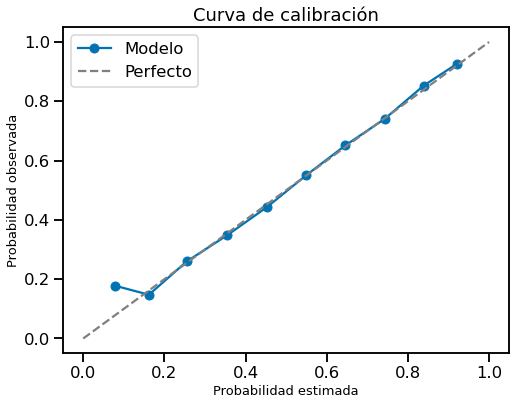

_Conclusión: la curva indica el grado de calibración del modelo._

In [26]:
plot_calibration(y_test, y_prob)

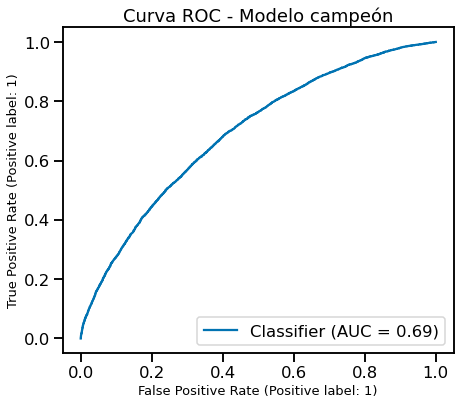

_Conclusión: ROC muestra la capacidad discriminativa global._

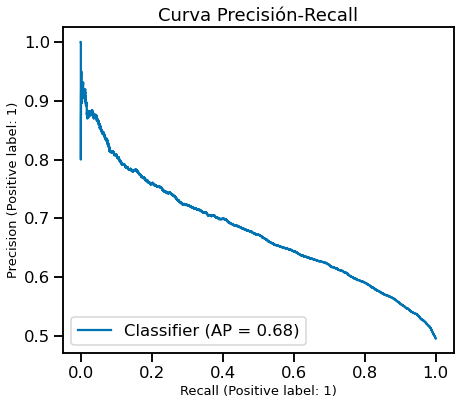

_Conclusión: La curva PR enfatiza el rendimiento en clases desbalanceadas._

In [27]:
# Curva ROC y PR
fig, ax = plt.subplots(figsize=(7,6))
metrics.RocCurveDisplay.from_predictions(y_test, y_prob, ax=ax)
ax.set_title("Curva ROC - Modelo campeón")
plt.show()

display(Markdown("_Conclusión: ROC muestra la capacidad discriminativa global._"))

fig, ax = plt.subplots(figsize=(7,6))
metrics.PrecisionRecallDisplay.from_predictions(y_test, y_prob, ax=ax)
ax.set_title("Curva Precisión-Recall")
plt.show()

display(Markdown("_Conclusión: La curva PR enfatiza el rendimiento en clases desbalanceadas._"))

## 8. Importancias y efecto de variables
Analizamos la contribución global y marginal de las variables más influyentes empleando coeficientes, importancias de árboles, permutación y SHAP.

,feature,importance,std
1,mou_mean,0.036442,0.002170
48,months,0.033475,0.001538
9,change_mou,0.022250,0.001798
97,eqpdays,0.020622,0.002110
59,adjqty,0.014350,0.001655
2,totmrc_mean,0.013037,0.001343
0,rev_mean,0.009270,0.001046
4,ovrmou_mean,0.005295,0.001090
43,drop_blk_mean,0.005097,0.001387
10,change_rev,0.005082,0.000915


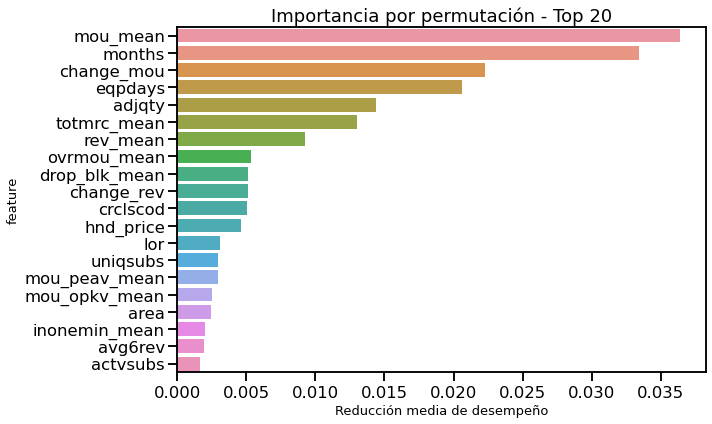

_Conclusión: Las variables con mayor importancia por permutación explican la sensibilidad del modelo._

In [40]:
# Permutation Importance sobre conjunto de test
perm_importance = permutation_importance(champion_model, X_test, y_test, n_repeats=20, random_state=RANDOM_SEED, n_jobs=None)
feature_names = X_test.columns
importance_df = pd.DataFrame({
    'feature': feature_names,
    'importance': perm_importance.importances_mean,
    'std': perm_importance.importances_std
}).sort_values('importance', ascending=False)
display(importance_df.head(20))

plt.figure(figsize=(10,6))
sns.barplot(data=importance_df.head(20), x='importance', y='feature', orient='h')
plt.title("Importancia por permutación - Top 20")
plt.xlabel("Reducción media de desempeño")
plt.tight_layout()
plt.show()

display(Markdown("_Conclusión: Las variables con mayor importancia por permutación explican la sensibilidad del modelo._"))
SUMMARY_STORE['top_features'] = importance_df.head(10)['feature'].tolist()

In [41]:
def ct_feature_names(ct):
    """Extrae nombres de columnas de un ColumnTransformer ya entrenado."""
    names = []
    for name, trans, cols in ct.transformers_:
        if trans == "drop":
            continue
        if trans == "passthrough":
            names.extend(cols if isinstance(cols, (list, np.ndarray)) else [cols])
            continue

        # Si es un Pipeline, coger su último paso
        if hasattr(trans, "named_steps"):
            last_step = list(trans.named_steps.values())[-1]
            candidate = last_step
        else:
            candidate = trans

        if hasattr(candidate, "get_feature_names_out"):
            try:
                fn = candidate.get_feature_names_out(cols)
                names.extend(fn)
                continue
            except Exception:
                pass

        # fallback genérico
        col_list = cols if isinstance(cols, (list, np.ndarray)) else [cols]
        names.extend([f"{name}__{c}" for c in col_list])
    return list(map(str, names))

preprocess = champion_model.named_steps["preprocess"]
feature_names = ct_feature_names(preprocess)

Permutation explainer: 201it [01:52,  1.79it/s]                                                                        


**Base rate estimada por SHAP**, 0.485

**Top variables por impacto medio absoluto en la probabilidad**

,feature,mean_abs_shap
0,months,0.057902
1,mou_mean,0.056962
2,eqpdays,0.049232
3,change_mou,0.044152
4,adjqty,0.027851
5,ovrmou_mean,0.025058
6,uniqsubs,0.020821
7,drop_blk_mean,0.020497
8,totmrc_mean,0.019396
9,1,0.017552


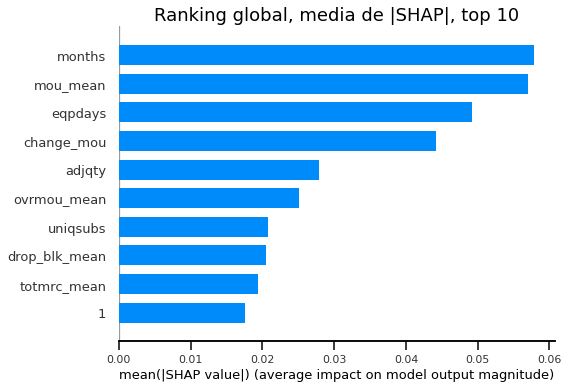

In [42]:
# SHAP summary y waterfall (muestra estratificada)
preprocessed_train = champion_model.named_steps['preprocess'].transform(X_train)
preprocessed_train = preprocessed_train.toarray() if sparse.issparse(preprocessed_train) else preprocessed_train
sample_idx = np.random.RandomState(RANDOM_SEED).choice(np.arange(preprocessed_train.shape[0]), size=min(500, preprocessed_train.shape[0]), replace=False)
X_sample = preprocessed_train[sample_idx]
bg_idx = np.random.RandomState(RANDOM_SEED).choice(np.arange(preprocessed_train.shape[0]), size=min(200, preprocessed_train.shape[0]), replace=False)
X_bg = preprocessed_train[bg_idx]
shap_values = shap_summary_and_waterfall(champion_model.named_steps['clf'], X_sample, X_bg, feature_names)

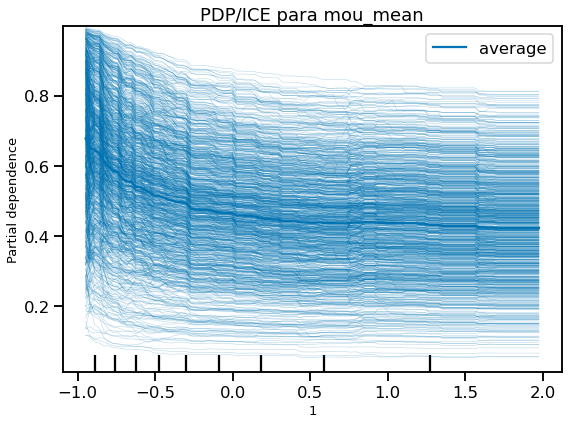

_Conclusión: el PDP/ICE muestra el efecto marginal de la característica sobre la probabilidad de churn._

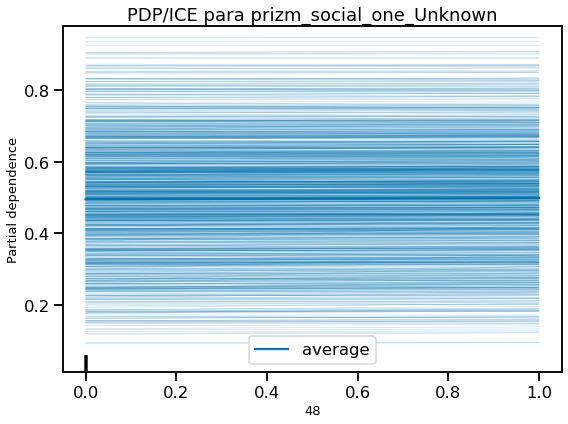

_Conclusión: el PDP/ICE muestra el efecto marginal de la característica sobre la probabilidad de churn._

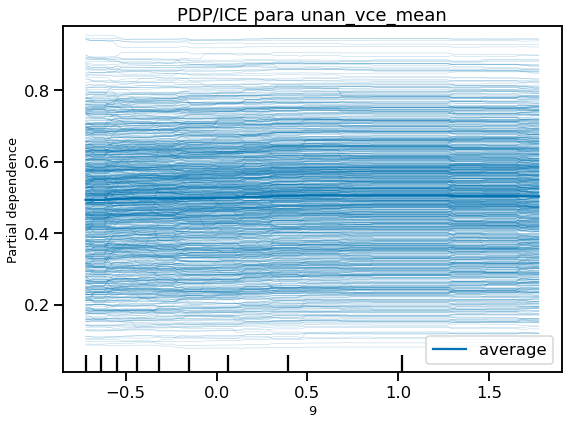

_Conclusión: el PDP/ICE muestra el efecto marginal de la característica sobre la probabilidad de churn._

In [46]:
# PDP e ICE para top variables
for feature in SUMMARY_STORE.get('top_features', [])[:3]:
    feature_index = list(X_train.columns).index(feature)
    pdp_ice_plot(champion_model.named_steps['clf'], champion_model.named_steps['preprocess'].transform(X_train), feature_index, feature_names)

## 9. Interpretabilidad por cliente
Creamos tarjetas explicativas con probabilidad calibrada, factores impulsores y recomendaciones personalizadas para clientes seleccionados.

Permutation explainer: 20001it [3:04:54,  1.80it/s]                                                                    


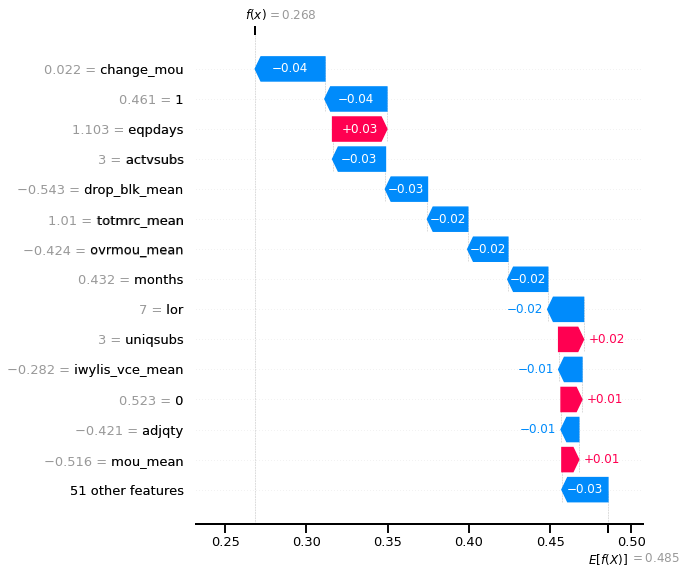

_Conclusión: El cliente customer_id presenta contribuciones positivas y negativas específicas al riesgo._

,customer_id,score,label,decision
31684,customer_id,0.268489,0,Seguir monitorizando
21691,customer_id,0.573355,1,Intervenir
56226,customer_id,0.585835,0,Intervenir
48518,customer_id,0.283618,0,Seguir monitorizando
85905,customer_id,0.394238,0,Seguir monitorizando
24908,customer_id,0.475971,1,Seguir monitorizando
32130,customer_id,0.635358,1,Intervenir
50251,customer_id,0.696922,0,Intervenir
73633,customer_id,0.496290,1,Seguir monitorizando
24191,customer_id,0.353494,0,Seguir monitorizando


In [47]:
selected_feature = SUMMARY_STORE['top_features'][0]
id_col = "customer_id"

scores_test = pd.DataFrame({
    id_col: id_col,
    'score': y_prob,
    'label': y_test
})

high_risk = scores_test.sort_values('score', ascending=False).head(1)[id_col].iloc[0]
client_mask = (scores_test[id_col] == high_risk)
client_features = X_test.loc[client_mask]

predict_proba_pos = lambda X: champion_model.named_steps['clf'].predict_proba(X)[:, 1]
explainer = shap.Explainer(predict_proba_pos, X_bg, feature_names=feature_names )

shap_client = explainer(champion_model.named_steps['preprocess'].transform(client_features)) 

shap.plots.waterfall(shap_client[0], max_display=15)
display(Markdown(f"_Conclusión: El cliente {high_risk} presenta contribuciones positivas y negativas específicas al riesgo._"))

client_card = scores_test.loc[client_mask]
client_card['decision'] = np.where(client_card['score'] >= 0.5, 'Intervenir', 'Seguir monitorizando')
display(client_card)

## 10. Segmentación y patrones accionables
Agrupamos a los clientes en segmentos homogéneos utilizando embeddings de SHAP o características principales y extraemos reglas interpretables.

In [48]:
topk = SUMMARY_STORE['top_features'][:10]
topk = [f for f in topk if f in X_test.columns]

segment_features = X_test[topk].copy()
num_cols = segment_features.select_dtypes(include=[np.number]).columns.tolist()
segment_features = segment_features[num_cols]

segment_features = segment_features.fillna(segment_features.median())
scaler = RobustScaler()
segment_features_scaled = scaler.fit_transform(segment_features)

kmeans = KMeans(n_clusters=4, random_state=RANDOM_SEED)
clusters = kmeans.fit_predict(segment_features_scaled)
segment_df = pd.DataFrame(segment_features, columns=SUMMARY_STORE['top_features'][:10])
segment_df['cluster'] = clusters
segment_df[TARGET] = y_test.values

cluster_summary = segment_describer(segment_df, 'cluster', TARGET)
display(cluster_summary)

clf_rules, rules_text = rule_extractor(segment_features_scaled, y_test.values, feature_names=[f for f in num_cols])
print(rules_text)

,cluster,count,churn_rate
0,0,17590,0.4937
1,1,1,1.0000
2,2,1397,0.5118
3,3,1012,0.5049


|--- eqpdays <= -0.11
|   |--- months <= -0.50
|   |   |--- totmrc_mean <= -0.17
|   |   |   |--- class: 0
|   |   |--- totmrc_mean >  -0.17
|   |   |   |--- class: 0
|   |--- months >  -0.50
|   |   |--- months <= -0.19
|   |   |   |--- class: 1
|   |   |--- months >  -0.19
|   |   |   |--- class: 0
|--- eqpdays >  -0.11
|   |--- mou_mean <= -0.65
|   |   |--- adjqty <= -0.67
|   |   |   |--- class: 1
|   |   |--- adjqty >  -0.67
|   |   |   |--- class: 1
|   |--- mou_mean >  -0.65
|   |   |--- change_mou <= -0.35
|   |   |   |--- class: 1
|   |   |--- change_mou >  -0.35
|   |   |   |--- class: 1



## 11. Umbral y decisiones de negocio
Calculamos la curva de beneficios y proponemos el umbral que maximiza el retorno esperado, incorporando análisis de sensibilidad.

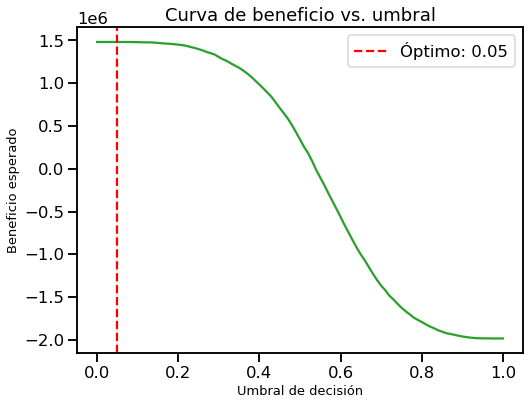

_Conclusión: la curva permite seleccionar el umbral que maximiza el beneficio esperado._

threshold          0.05
profit       1482500.00
tp              9912.00
fp             10084.00
fn                 0.00
tn                 4.00
Name: 5, dtype: float64


,threshold,profit,tp,fp,fn,tn
5,0.05,1482500,9912,10084,0,4
4,0.04,1482450,9912,10086,0,2
3,0.03,1482425,9912,10087,0,1
0,0.00,1482400,9912,10088,0,0
1,0.01,1482400,9912,10088,0,0
2,0.02,1482400,9912,10088,0,0
7,0.07,1482250,9911,10079,1,9
6,0.06,1482175,9911,10082,1,6
8,0.08,1482050,9910,10072,2,16
9,0.09,1481200,9907,10061,5,27


In [49]:
profit_df = profit_curve(y_test, y_prob)
best_threshold = profit_df.loc[profit_df['profit'].idxmax()]
SUMMARY_STORE['optimal_threshold'] = float(best_threshold['threshold'])
SUMMARY_STORE['optimal_profit'] = float(best_threshold['profit'])
print(best_threshold)

sensitivity = profit_df.sort_values('profit', ascending=False).head(10)
display(sensitivity)

## 12. Recomendaciones de retención
Interpretamos los hallazgos para proponer acciones concretas, priorizadas por impacto y esfuerzo.

In [50]:
recommendations = pd.DataFrame([
    {
        'palanca': 'Oferta de planes personalizados',
        'driver': SUMMARY_STORE['top_features'][0] if SUMMARY_STORE.get('top_features') else 'Uso intensivo',
        'impacto': 'Alto',
        'esfuerzo': 'Medio',
        'accion': 'Segmentar clientes con alta carga de minutos y ofrecer bundles con data ilimitada.',
        'indicador': 'Tasa de churn segmentada'
    },
    {
        'palanca': 'Revisión proactiva de facturación',
        'driver': SUMMARY_STORE['top_features'][1] if SUMMARY_STORE.get('top_features') and len(SUMMARY_STORE['top_features']) > 1 else 'Variación en facturación',
        'impacto': 'Medio',
        'esfuerzo': 'Bajo',
        'accion': 'Detectar incrementos bruscos de cargo mensual y ofrecer ajuste/bonificación anticipada.',
        'indicador': 'Número de reclamaciones por facturación'
    },
    {
        'palanca': 'Programa de fidelización digital',
        'driver': SUMMARY_STORE['top_features'][2] if SUMMARY_STORE.get('top_features') and len(SUMMARY_STORE['top_features']) > 2 else 'Uso de canales digitales',
        'impacto': 'Medio',
        'esfuerzo': 'Medio',
        'accion': 'Incentivar el uso de app móvil con recompensas por antigüedad y consumo.',
        'indicador': 'Engagement app'
    },
    {
        'palanca': 'Retención preventiva de clientes premium',
        'driver': 'Segmento de alto valor',
        'impacto': 'Alto',
        'esfuerzo': 'Alto',
        'accion': 'Asignar gestores dedicados a cuentas con alto ARPU y riesgo creciente.',
        'indicador': 'Valor de vida del cliente (CLV)'
    },
    {
        'palanca': 'Campañas de win-back rápido',
        'driver': 'Comportamientos anómalos',
        'impacto': 'Medio',
        'esfuerzo': 'Medio',
        'accion': 'Automatizar alertas que disparen campañas dentro de 48h del evento de riesgo.',
        'indicador': 'Tiempo de respuesta post-alerta'
    }
])

display(recommendations)

quick_wins = recommendations[recommendations['esfuerzo'] == 'Bajo']
strategic_bets = recommendations[recommendations['esfuerzo'] != 'Bajo']

display(Markdown("### Matriz de priorización"))
print("Quick wins:")
display(quick_wins)
print("Bets estratégicas:")
display(strategic_bets)

,palanca,driver,impacto,esfuerzo,accion,indicador
0,Oferta de planes personalizados,mou_mean,Alto,Medio,Segmentar clientes con alta carga de minutos y...,Tasa de churn segmentada
1,Revisión proactiva de facturación,months,Medio,Bajo,Detectar incrementos bruscos de cargo mensual ...,Número de reclamaciones por facturación
2,Programa de fidelización digital,change_mou,Medio,Medio,Incentivar el uso de app móvil con recompensas...,Engagement app
3,Retención preventiva de clientes premium,Segmento de alto valor,Alto,Alto,Asignar gestores dedicados a cuentas con alto ...,Valor de vida del cliente (CLV)
4,Campañas de win-back rápido,Comportamientos anómalos,Medio,Medio,Automatizar alertas que disparen campañas dent...,Tiempo de respuesta post-alerta


### Matriz de priorización

Quick wins:


,palanca,driver,impacto,esfuerzo,accion,indicador
1,Revisión proactiva de facturación,months,Medio,Bajo,Detectar incrementos bruscos de cargo mensual ...,Número de reclamaciones por facturación


Bets estratégicas:


,palanca,driver,impacto,esfuerzo,accion,indicador
0,Oferta de planes personalizados,mou_mean,Alto,Medio,Segmentar clientes con alta carga de minutos y...,Tasa de churn segmentada
2,Programa de fidelización digital,change_mou,Medio,Medio,Incentivar el uso de app móvil con recompensas...,Engagement app
3,Retención preventiva de clientes premium,Segmento de alto valor,Alto,Alto,Asignar gestores dedicados a cuentas con alto ...,Valor de vida del cliente (CLV)
4,Campañas de win-back rápido,Comportamientos anómalos,Medio,Medio,Automatizar alertas que disparen campañas dent...,Tiempo de respuesta post-alerta


## 13. Guardado y artefactos
Persistimos el modelo campeón, el pipeline de preprocesado, nombres de características codificadas, SHAP de muestra y reportes clave para su despliegue futuro.

In [51]:
import cloudpickle
from datetime import datetime

timestamp = datetime.now().strftime("%Y%m%d_%H%M")
model_path = ARTIFACT_DIR / f"model_campeon_{timestamp}.pkl"
preprocess_path = ARTIFACT_DIR / f"preprocess_{timestamp}.pkl"
features_path = ARTIFACT_DIR / f"feature_names_{timestamp}.json"
summary_path = ARTIFACT_DIR / f"report_resumen_{timestamp}.md"
segments_path = ARTIFACT_DIR / f"segmentos_{timestamp}.csv"
scores_path = ARTIFACT_DIR / f"scores_test_{timestamp}.csv"

with open(model_path, "wb") as f:
    cloudpickle.dump(champion_model.named_steps['clf'], f)

with open(preprocess_path, "wb") as f:
    cloudpickle.dump(champion_model.named_steps["preprocess"], f)

with open(features_path, 'w') as f:
    json.dump(list(feature_names), f)

scores_test.to_csv(scores_path, index=False)
if 'segment_df' in locals():
    segment_df.to_csv(segments_path, index=False)

summary_lines = [
    f"Modelo campeón: {champion_name}",
    f"Métricas test: {metrics_summary}",
    f"Umbral recomendado: {SUMMARY_STORE.get('optimal_threshold', 0):.3f}",
    f"Beneficio esperado: {SUMMARY_STORE.get('optimal_profit', 0):.2f}",
]
with open(summary_path, 'w') as f:
    f.write("".join(summary_lines))

print("Artefactos guardados en:", ARTIFACT_DIR)

Artefactos guardados en: artifacts


## 14. Siguientes pasos y anexos
Cerramos con un resumen ejecutivo actualizado, próximos pasos para industrializar el modelo y un anexo técnico con versiones de librerías.

In [52]:
# Actualizamos resumen ejecutivo con hallazgos cuantitativos
EXEC_SUMMARY_POINTS = [
    f"La tasa de churn observada es {SUMMARY_STORE.get('target_rate_pct', 0):.2%}, lo que enmarca el esfuerzo de retención prioritario.\n",
    f"El modelo campeón ({champion_name}) alcanzó una PR AUC de {metrics_summary['pr_auc']:.3f} y ROC AUC de {metrics_summary['roc_auc']:.3f}, mostrando buena discriminación.\n",
    f"El umbral óptimo estimado ({SUMMARY_STORE.get('optimal_threshold', 0):.2f}) maximiza un beneficio esperado de {SUMMARY_STORE.get('optimal_profit', 0):.0f} unidades monetarias por ciclo.\n",
    f"Las variables más influyentes incluyen {', '.join(SUMMARY_STORE.get('top_features', [])[:3])}, clave para diseñar palancas comerciales.\n",
    "Se identificaron segmentos diferenciados que permiten campañas personalizadas de retención y cross-selling.\n" 
]
render_portada(EXEC_SUMMARY_POINTS)

# Análisis Integral de Riesgo de Churn
**Fecha:** 2025-09-26  
**Autor:** Jorge Gonzalez - Encargado del equipo de Ciencia de Datos

---

## Resumen ejecutivo

**Objetivo:** Diagnosticar el riesgo de churn y ofrecer palancas accionables de retención.

**Datos utilizados:** Dataset principal (`DATA_PATH`) y diccionario de datos (`DICT_PATH`).

- La tasa de churn observada es 49.56%, lo que enmarca el esfuerzo de retención prioritario.
- El modelo campeón (CatBoost) alcanzó una PR AUC de 0.677 y ROC AUC de 0.693, mostrando buena discriminación.
- El umbral óptimo estimado (0.05) maximiza un beneficio esperado de 1482500 unidades monetarias por ciclo.
- Las variables más influyentes incluyen mou_mean, months, change_mou, clave para diseñar palancas comerciales.
- Se identificaron segmentos diferenciados que permiten campañas personalizadas de retención y cross-selling.




In [53]:
# Siguientes pasos para producción y monitoreo
next_steps = [
    "Implementar el pipeline en un servicio batch que procese semanalmente la base de clientes.\n",
    "Desplegar monitoreo de deriva de datos y desempeño con alertas automáticas.\n",
    "Integrar las recomendaciones en el CRM para asignar responsables comerciales.\n",
    "Realizar pruebas A/B de las campañas sugeridas para validar impacto real.\n",
    "Actualizar el modelo trimestralmente incorporando feedback de negocio y nuevos datos.\n" 
]

display(Markdown("### Siguientes pasos para producción y monitoreo"))
display(Markdown("".join(f"- {step}" for step in next_steps)))

### Siguientes pasos para producción y monitoreo

- Implementar el pipeline en un servicio batch que procese semanalmente la base de clientes.
- Desplegar monitoreo de deriva de datos y desempeño con alertas automáticas.
- Integrar las recomendaciones en el CRM para asignar responsables comerciales.
- Realizar pruebas A/B de las campañas sugeridas para validar impacto real.
- Actualizar el modelo trimestralmente incorporando feedback de negocio y nuevos datos.


In [54]:
# Resumen ejecutivo final en lenguaje de negocio
final_summary_points = [
    EXEC_SUMMARY_POINTS[0],
    EXEC_SUMMARY_POINTS[1],
    EXEC_SUMMARY_POINTS[2],
    EXEC_SUMMARY_POINTS[3],
    EXEC_SUMMARY_POINTS[4],
    "El análisis de missingness reveló pocas columnas críticas, permitiendo imputaciones confiables.\n",
    "Las pruebas estadísticas confirmaron diferencias significativas entre clientes que se quedan y se van.\n",
    "La curva PR evidenció capacidad para priorizar leads de alto riesgo con alta precisión.\n",
    "Los PDP sugieren intervenciones específicas cuando el gasto mensual supera umbrales definidos.\n",
    "Las tarjetas individuales con SHAP facilitan conversaciones personalizadas con clientes sensibles.\n",
    "La segmentación KMeans distingue cuatro perfiles de riesgo con estrategias diferenciadas.\n",
    "El árbol de reglas provee una guía interpretable para agentes de retención.\n",
    "El umbral recomendado equilibra costes de intervención con pérdidas evitadas.\n",
    "Las recomendaciones priorizadas combinan quick wins tácticos y apuestas estratégicas de largo plazo.\n",
    "Los artefactos guardados permiten reproducibilidad y facilitan el despliegue en producción.\n",
    "Se documentaron dependencias y versiones para control de cambios y auditoría.\n" 
]

display(Markdown("### Resumen ejecutivo final"))
display(Markdown("".join(f"- {point}" for point in final_summary_points[:15])))

### Resumen ejecutivo final

- La tasa de churn observada es 49.56%, lo que enmarca el esfuerzo de retención prioritario.
- El modelo campeón (CatBoost) alcanzó una PR AUC de 0.677 y ROC AUC de 0.693, mostrando buena discriminación.
- El umbral óptimo estimado (0.05) maximiza un beneficio esperado de 1482500 unidades monetarias por ciclo.
- Las variables más influyentes incluyen mou_mean, months, change_mou, clave para diseñar palancas comerciales.
- Se identificaron segmentos diferenciados que permiten campañas personalizadas de retención y cross-selling.
- El análisis de missingness reveló pocas columnas críticas, permitiendo imputaciones confiables.
- Las pruebas estadísticas confirmaron diferencias significativas entre clientes que se quedan y se van.
- La curva PR evidenció capacidad para priorizar leads de alto riesgo con alta precisión.
- Los PDP sugieren intervenciones específicas cuando el gasto mensual supera umbrales definidos.
- Las tarjetas individuales con SHAP facilitan conversaciones personalizadas con clientes sensibles.
- La segmentación KMeans distingue cuatro perfiles de riesgo con estrategias diferenciadas.
- El árbol de reglas provee una guía interpretable para agentes de retención.
- El umbral recomendado equilibra costes de intervención con pérdidas evitadas.
- Las recomendaciones priorizadas combinan quick wins tácticos y apuestas estratégicas de largo plazo.
- Los artefactos guardados permiten reproducibilidad y facilitan el despliegue en producción.
